# Testing notebook for nifty fit on atmosphere TODs directly (no image)

# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


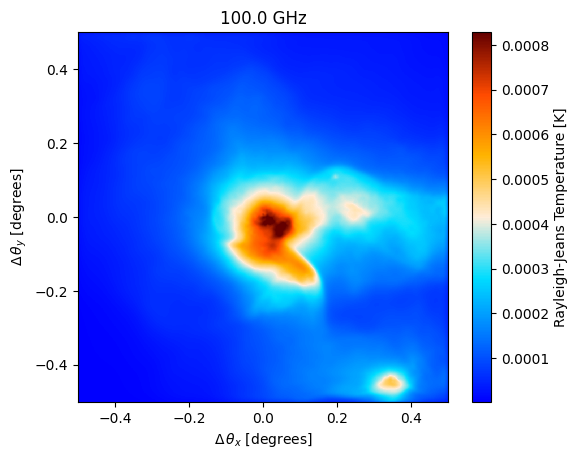

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/big_cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename,
                                width=1., #degrees
                                index=1,
                                center=(300.0, -10.0), #RA and Dec in degrees
                                units ='Jy/pixel'
                               )

input_map.to(units="K_RJ").plot()

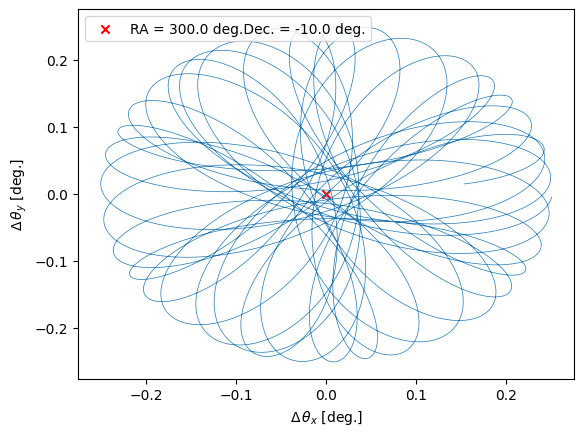

In [2]:
plan = maria.get_plan(scan_pattern="daisy",
                      scan_options={"radius": 0.25, "speed": 0.5}, # in degrees
                      duration=60, # in seconds
                      sample_rate=225, # in Hz
                        # sample_rate=20, # in Hz
                      start_time = "2022-08-10T06:00:00",
                      scan_center=(300.0, -10.0),
                      frame="ra_dec")
plan.plot()

2024-10-10 13:33:25.634 INFO: Constructed instrument.
2024-10-10 13:33:25.635 INFO: Constructed plan.
2024-10-10 13:33:25.635 INFO: Constructed site.
2024-10-10 13:33:26.351 INFO: Constructed boresight.
2024-10-10 13:33:31.807 INFO: Constructed offsets.


Initialized base in 6174 ms.


Generating noise: 100%|██████████| 1/1 [00:08<00:00,  9.00s/it]
Generating atmosphere: 4it [00:08,  2.12s/it]
Sampling map (f092): 100%|██████████| 1/1 [00:56<00:00, 56.29s/it]


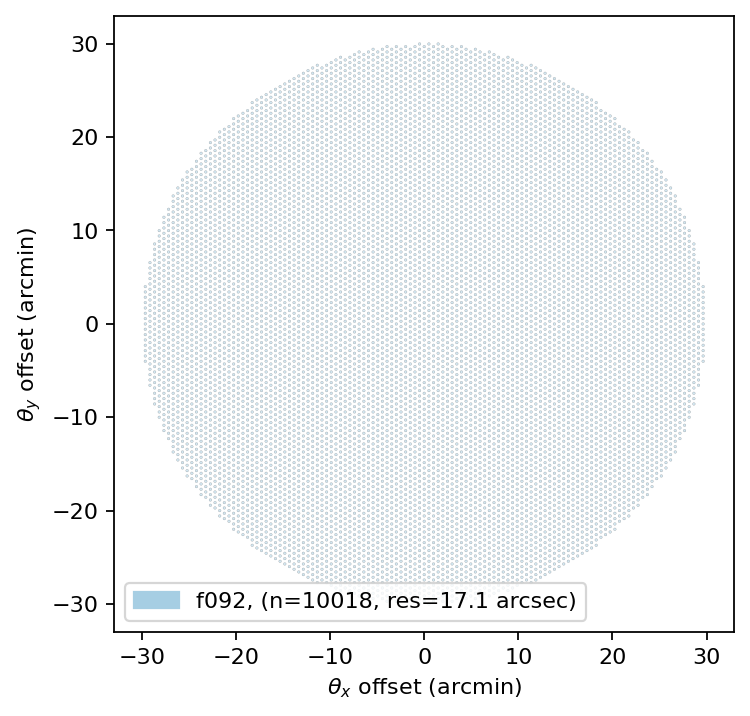

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.get_atlast()
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

dx

array([[0.00268416, 0.00271426, 0.00274339, ..., 0.00437778, 0.00438114,
        0.00438433],
       [0.00281849, 0.00284858, 0.00287772, ..., 0.00451203, 0.00451538,
        0.00451858],
       [0.00254984, 0.00257993, 0.00260906, ..., 0.00424354, 0.0042469 ,
        0.00425009],
       ...,
       [0.00316056, 0.00319048, 0.00321945, ..., 0.00486158, 0.00486479,
        0.00486782],
       [0.00948298, 0.00951318, 0.00954242, ..., 0.0111719 , 0.01117536,
        0.01117865],
       [0.01081714, 0.01084717, 0.01087624, ..., 0.01251345, 0.01251675,
        0.01251989]])

Running mapper (f092): 100%|██████████| 1/1 [01:47<00:00, 107.90s/it]


mapdata_truth shape: (1, 1024, 1024)
mapdata_truth mean: 0.00013284593853240577


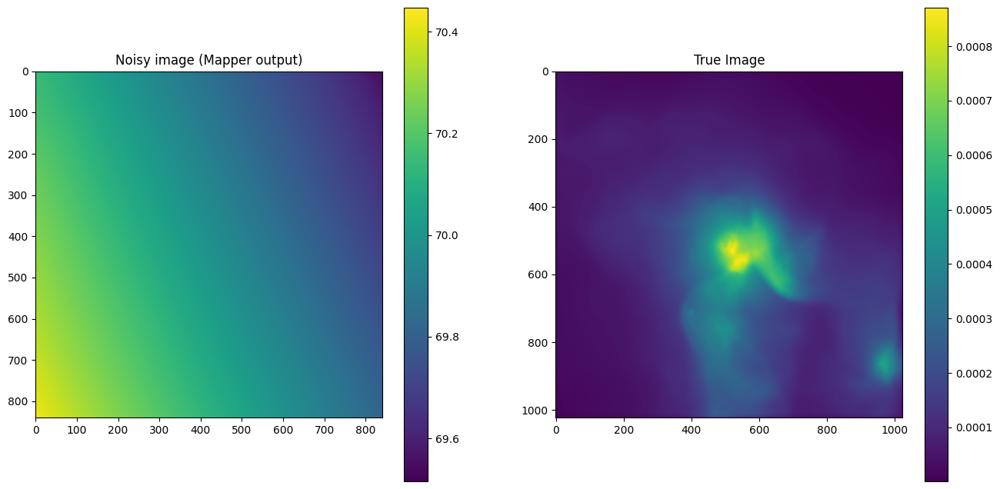

In [5]:
from maria.map.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
# mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 0}} )
mapper_truthmap = BinMapper(center=(300.0, -10.0), frame="ra_dec", width=1., height=1., resolution=np.degrees(np.nanmin(instrument.fwhm))/4., map_postprocessing={"gaussian_filter": {"sigma": 0} } )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-10-10 13:38:50.453 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-10 13:38:50.455 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

In [7]:
sim_truthmap_x_side = jax.numpy.flip(sim_truthmap.map.x_side)
sim_truthmap_y_side = jax.numpy.flip(sim_truthmap.map.y_side)

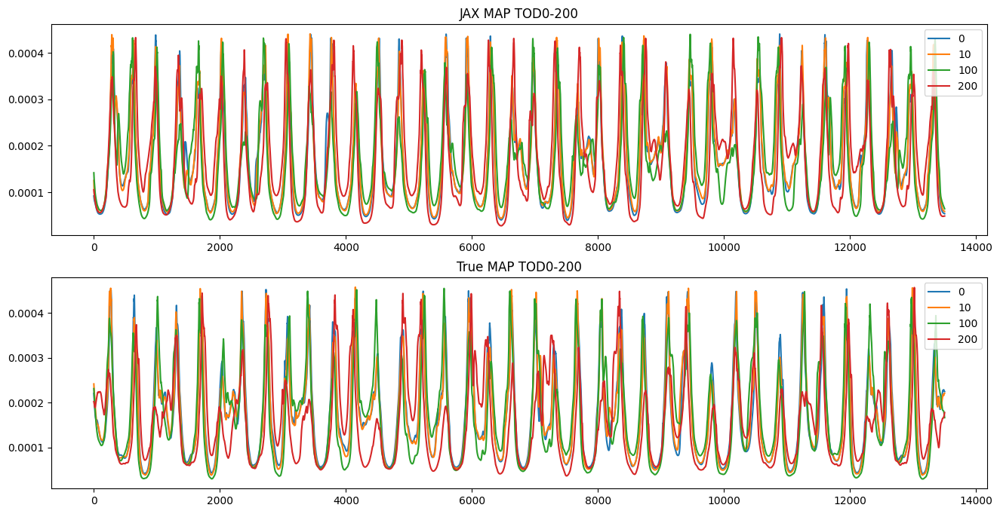

In [8]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)

fig, axes = plt.subplots(2, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.components['map'].compute())
    im1 = axes[1].plot(tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True MAP TOD0-{i}')
axes[1].legend()

plt.show()

# Smooth atmosphere TODs:

In [9]:
import scipy as sp

jax_tods_atmos = tod_truthmap.components['atmosphere']
jax_tods_atmos_smooth = np.zeros(jax_tods_atmos.shape)

for i in range(jax_tods_atmos.shape[0]):
    jax_tods_atmos_smooth[i] = sp.ndimage.gaussian_filter1d(jax_tods_atmos[i], sigma=50)

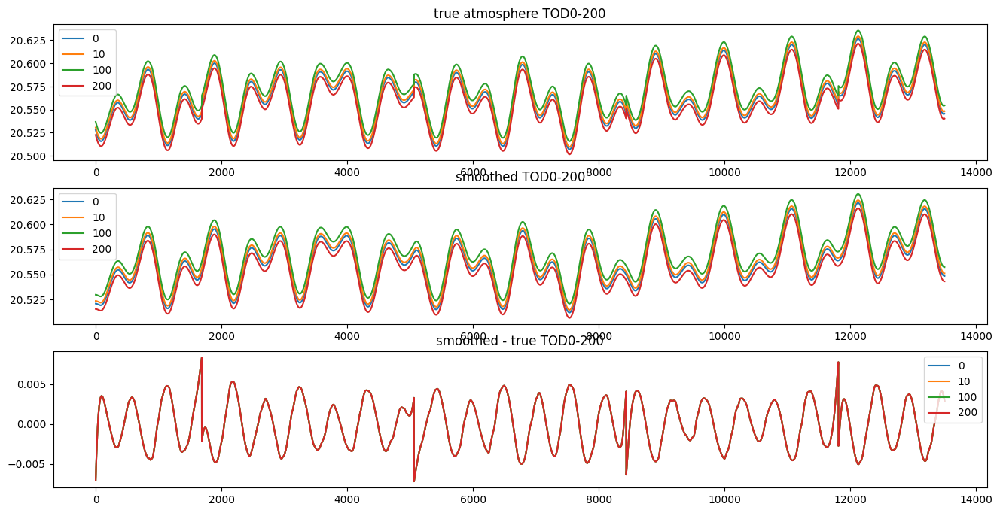

In [10]:
# plot smoothed atmos:

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    # im0 = axes[0].plot(jax_tods_atmos[i, 0:1000], label=i)
    # im1 = axes[1].plot(jax_tods_atmos_smooth[i, 0:1000], label=i)
    # im2 = axes[2].plot(jax_tods_atmos_smooth[i, 0:1000] - jax_tods_atmos[i, 0:1000], label=i)
    im0 = axes[0].plot(jax_tods_atmos[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i], label=i)
    im2 = axes[2].plot(jax_tods_atmos_smooth[i] - jax_tods_atmos[i], label=i)
    
axes[0].title.set_text(f'true atmosphere TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'smoothed TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'smoothed - true TOD0-{i}')
axes[2].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.00028091617


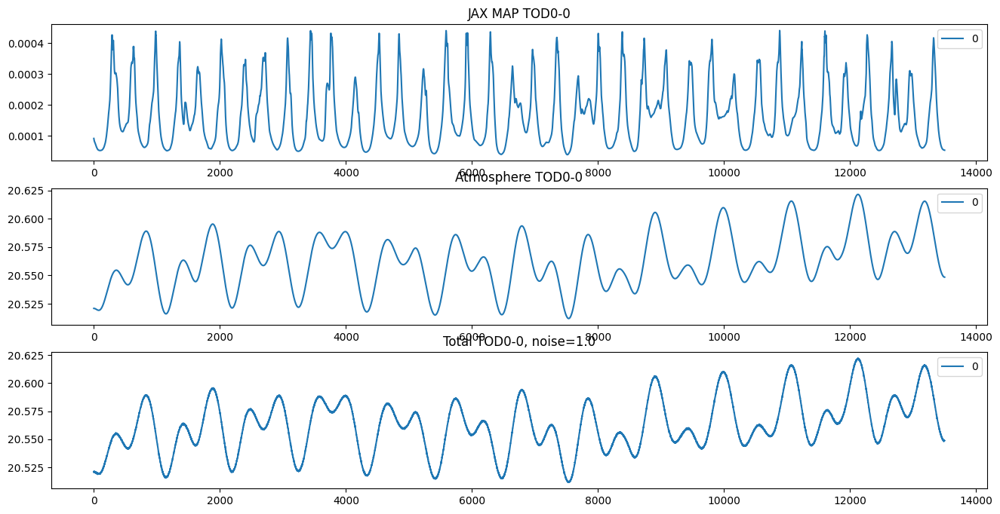

In [11]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
n = 1
# n = 10
# n = 100
# n = jax_tods_map.shape[0]

jax_tods_atmos = tod_truthmap.components['atmosphere']
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.components['noise']*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos_smooth[:n]) 
# noised_jax_tod[:n] = np.float64(jax_tods_atmos_smooth[:n])

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.components['noise']*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.components['noise'].compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0]:
# for i in range(0, n, n//10):
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    # im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

# Next, initialise nifty prior model

Start with the atmosphere TOD model:

In [12]:
dims_atmos = (jax_tods_atmos.shape[1] + 2000,)
padding_atmos = dims_atmos[0] - jax_tods_atmos.shape[1]

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.001, 0.1))
cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0005, 0.001))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    # fluctuations=(0.005, 0.005), 
    fluctuations=(0.005, 0.003), 
    loglogavgslope=(-3, 0.5), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
cfm_tod = jft.CorrelatedFieldMaker("")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize()

## Add one Correlated field per TOD with shared flucts and zero-mean

In [13]:
# init params for each TOD:

gps_tods = []
for i in range(n):
    cfmi = jft.CorrelatedFieldMaker(f'tod{i} ')
    # cfmi.set_amplitude_total_offset(**cf_zm_tod)
    cfmi._azm = cfm_tod._azm
    cfmi._offset_mean = cfm_tod._offset_mean
    cfmi._parameter_tree['zeromode'] = jft.ShapeWithDtype(())

    cfmi._fluctuations.append(cfm_tod._fluctuations[0])
    cfmi._target_grids.append(cfm_tod._target_grids[0])
    cfmi._parameter_tree.update(cfm_tod._fluctuations[0].domain)
    gps_tods.append(cfmi.finalize())

## Now for the map model:

In [14]:
dims_map = (mapdata_truth.shape[1] + 200, mapdata_truth.shape[2] + 200)
padding_map = dims_map[0] - mapdata_truth.shape[1]

# Map model

# correlated field zero mode GP offset and stddev
# cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-7, 1e-6))
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    # fluctuations=(2e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    fluctuations=(3e-5, 1e-5), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

In [15]:
# only tod:
# class Signal_TOD(jft.Model):
#     def __init__(self, gps_tods):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         self.gps_tods = gps_tods
#         self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         # self.gp_map = gp_map
#         # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
#         super().__init__(init=reduce(or_, [gp.init for gp in gps_tods]), domain=reduce(or_, [gp.domain for gp in gps_tods]))
    
#     def __call__(self, x):
#         res_tods = jnp.zeros(self.tgt)
#         for i, gp in enumerate(self.gps_tods):
#             res_tods = res_tods.at[i].set(gp(x))
        
#         return res_tods[:, padding_atmos//2:-padding_atmos//2]

#         # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)

#         # # Only add first n atmosphere tods, otherwise use map
#         # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         # return modified_res_map

# signal_response_tod = Signal_TOD(gps_tods)

# map only:
# class Signal_TOD(jft.Model):
#     def __init__(self, gp_map):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         # self.gps_tods = gps_tods
#         # self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         self.gp_map = gp_map
#         # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
#         super().__init__(init=gp_map.init, domain=gp_map.domain)
    
#     def __call__(self, x):
#         # res_tods = jnp.zeros(self.tgt)
#         # for i, gp in enumerate(self.gps_tods):
#         #     res_tods = res_tods.at[i].set(gp(x))
        
#         # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)
#         res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)
#         return res_map

#         # Only add first n atmosphere tods, otherwise use map
#         # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         # return modified_res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]
  
# signal_response_tod = Signal_TOD(gp_map)

In [16]:
# Define simple signal model with added map sampling
class Signal_TOD(jft.Model):
    def __init__(self, gps_tods, gp_map):
        # self.gp_tod = gp_tod
        # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
        self.gps_tods = gps_tods
        self.tgt = (len(gps_tods), gps_tods[0].target.size)
        self.gp_map = gp_map
        super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
    
    def __call__(self, x):
        res_tods = jnp.zeros(self.tgt)
        for i, gp in enumerate(self.gps_tods):
            res_tods = res_tods.at[i].set(gp(x))
        
        # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)

        # Only add first n atmosphere tods, otherwise use map
        modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

        return modified_res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]

signal_response_tod = Signal_TOD(gps_tods, gp_map)

# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [17]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1224, 1224), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod0 xi': ShapeWithDtype(shape=(15500,), dtype=<class 'jax.numpy.float64'>),
	 'zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'cfmapax1fluctuations': functools.partial(<function random_like at 0x7f8ac8328d60>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'cfmapax1loglogavgslope': functools.partial(<function random_like at 0x7f8ac8328d60>, primals=ShapeWi

# Draw Prior sample

(10018, 13500)


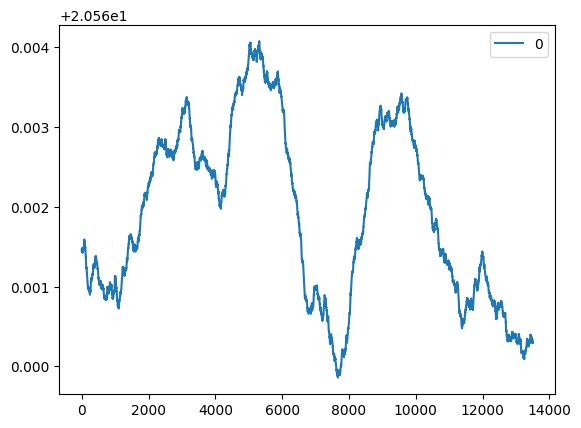

In [18]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
# for i in range(0, n, n//10):
for i in [0]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [19]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:3.700914e+02 ➽:1.513682e+02
M: Iteration 1 ⛰:+1.350620e+08 Δ⛰:2.436310e+07
M: →:0.125 ↺:False #∇²:12 |↘|:3.528602e+01 ➽:1.513682e+02
M: Iteration 2 ⛰:+1.336027e+08 Δ⛰:1.459228e+06
OPTIMIZE_KL: Iteration 0001 ⛰:+1.3360e+08
OPTIMIZE_KL: #(KL minimization steps) 2
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²:     2.0±     0.0, avg:  +0.0014±     0.0, #dof:135243000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²: 1.4e+01±     0.0, avg:     -3.8±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:    0.77±     0.0, avg:    -0.88±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: +0.00024±     0.0, #dof:1498176'
cfmapzeromode           :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
tod fluctuations        :: 'reduced χ²:     2.5±     0.0, avg:     -1.6±     0.0, #dof:      1'
tod loglogavgslope      :: 'reduced χ²: 1.5e+01±     0.0, avg:

In [20]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(-3.79172262, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-0.87707975, dtype=float64),
	 'cfmapxi': Array([[ 0.98667086, -5.80220498,  4.25649848, ..., -1.81641723,
	         5.16571273, -9.64451442],
	       [-0.85720178, -0.32108987, -0.77149891, ...,  1.68919347,
	        -1.94935679,  6.16605024],
	       [ 1.49944557, -1.03704651, -1.20025235, ...,  0.05143007,
	         2.73322973, -3.41430827],
	       ...,
	       [-0.94694211,  1.15155381, -0.74274889, ...,  2.40994466,
	        -0.6301748 ,  0.55840731],
	       [ 3.71256858, -2.41536548,  0.64679791, ...,  1.40772566,
	         2.06659287, -3.76474196],
	       [-9.7046147 ,  9.59827856, -4.30137542, ...,  0.87923746,
	        -4.71650985,  5.75928084]], dtype=float64),
	 'cfmapzeromode': Array(-0.40894137, dtype=float64),
	 'tod fluctuations': Array(-1.57745906, dtype=float64),
	 'tod loglogavgslope': Array(3.85093631, dtype=float64),
	 'tod0 xi': Array([-0.30113639,  2.14596016,

In [21]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")

    # If custom zeromode per TOD:
    # for i in range(n):
    #     test = samples.pos[f"tod{i} zeromode"]
    #     print(f"tod{i} zeromode: {jft.LogNormalPrior(cf_zm_tod['offset_mean'], cf_zm_tod['offset_std'][0])(test)}, {cf_zm_tod['offset_mean']}, {cf_zm_tod['offset_std'][0]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0017877788067234338, 0.005, 0.003
	loglogvarslope: -1.0745318455048933, -3, 0.5
	zeromode std (LogNormal): 3.221491578539708e-05, 0.0005, 0.001
map:
	fluctuations: 8.31242253533876e-06, 3e-05, 1e-05
	loglogvarslope: -2.938539872625163, -2.5, 0.5
	zeromode std (LogNormal): 4.1333493788188425e-10, 1e-08, 1e-07


(10018, 13500)


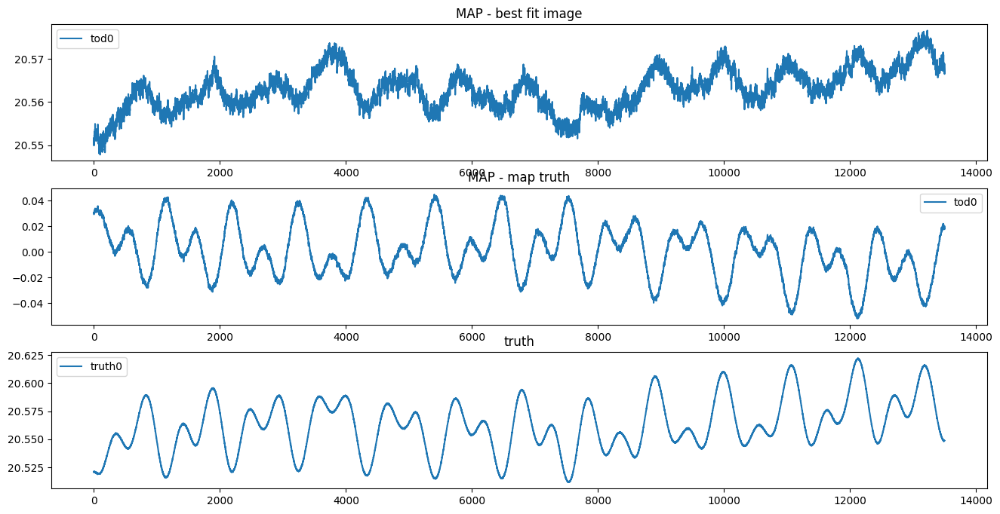

In [22]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
# for i in range(0, n, n//10):
for i in [0]:
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

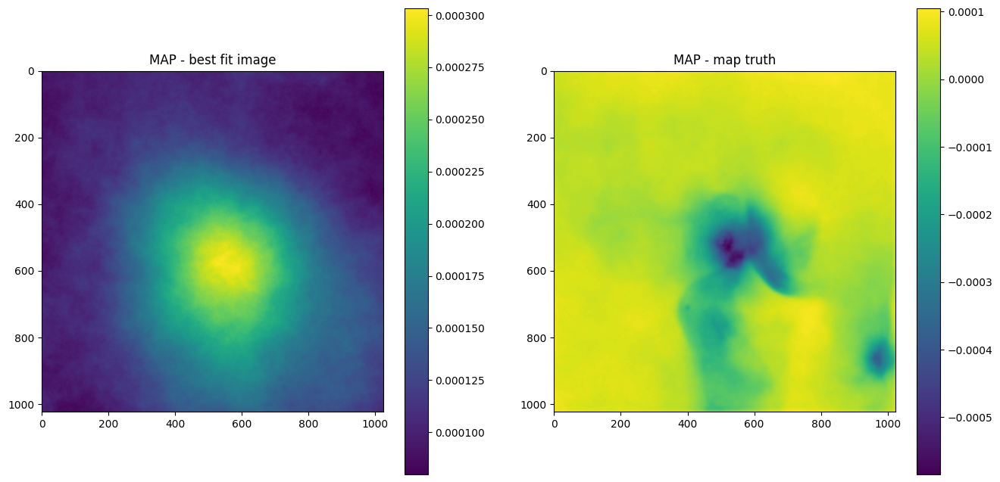

In [23]:
# plot maximum of posterior (mode)
sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [24]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:-3.4805e+05 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:-5.2207e+05 Δ⛰:1.7401e+05 ➽:1.5137e+01
SL: Iteration 2 ⛰:-5.7353e+05 Δ⛰:5.1463e+04 ➽:1.5137e+01
SL: Iteration 3 ⛰:-6.0966e+05 Δ⛰:3.6134e+04 ➽:1.5137e+01
SL: Iteration 4 ⛰:-6.2906e+05 Δ⛰:1.9392e+04 ➽:1.5137e+01
SL: Iteration 5 ⛰:-6.5264e+05 Δ⛰:2.3584e+04 ➽:1.5137e+01
SL: Iteration 6 ⛰:-6.6573e+05 Δ⛰:1.3088e+04 ➽:1.5137e+01
SL: Iteration 7 ⛰:-6.7306e+05 Δ⛰:7.3345e+03 ➽:1.5137e+01
SL: Iteration 8 ⛰:-6.8044e+05 Δ⛰:7.3783e+03 ➽:1.5137e+01
SL: Iteration 9 ⛰:-6.8774e+05 Δ⛰:7.2973e+03 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.9246e+05 Δ⛰:4.7207e+03 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.9603e+05 Δ⛰:3.5675e+03 ➽:1.5137e+01
SL: Iteration 12 ⛰:-7.0024e+05 Δ⛰:4.2096e+03 ➽:1.5137e+01
SL: Iteration 13 ⛰:-7.0345e+05 Δ⛰:3.2092e+03 ➽:1.5137e+01
SL: Iteration 14 ⛰:-7.0658e+05 Δ⛰:3.1377e+03 ➽:1.5137e+01
SL: Iteration 15 ⛰:-7.0929e+05 Δ⛰:2.7061e+03 ➽:1.5137e+01
SL: Iteration 16 ⛰:-7.0949e+05 Δ⛰:1.9791e+02 ➽:1.5137e+01
SL: 

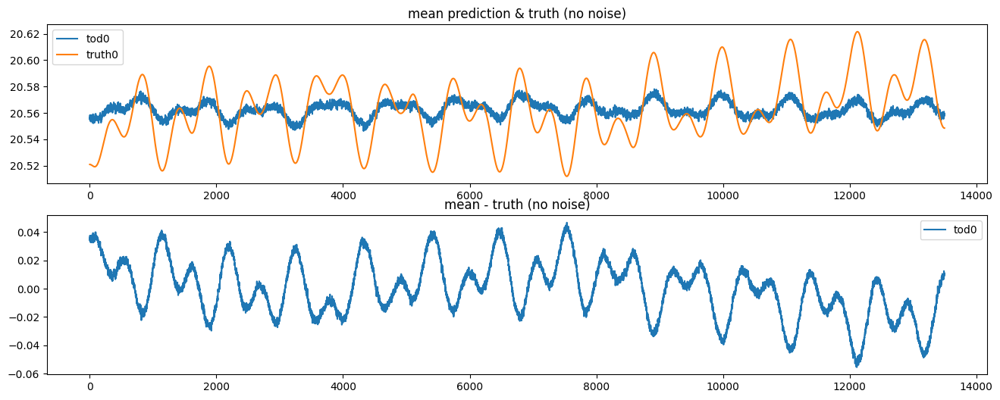

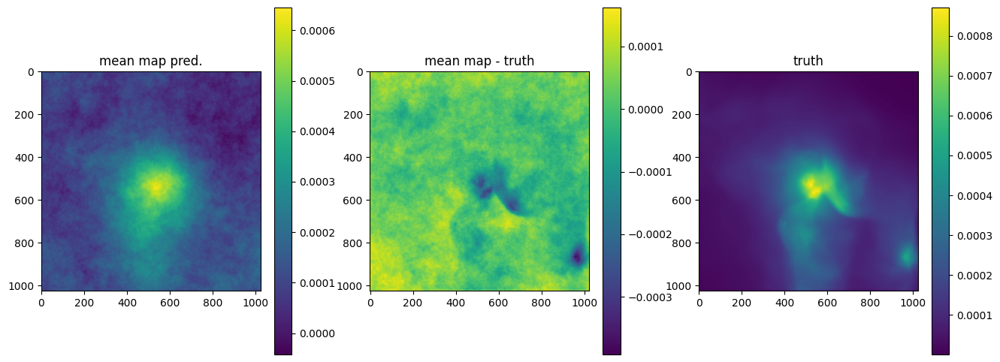

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+9.0638e+06 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+7.3161e+05 Δ⛰:8.3322e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+1.3814e+05 Δ⛰:5.9347e+05 ➽:1.5137e+01
SL: Iteration 3 ⛰:-1.4393e+05 Δ⛰:2.8207e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:-2.3438e+05 Δ⛰:9.0441e+04 ➽:1.5137e+01
SL: Iteration 5 ⛰:-2.9182e+05 Δ⛰:5.7440e+04 ➽:1.5137e+01
SL: Iteration 6 ⛰:-3.2931e+05 Δ⛰:3.7490e+04 ➽:1.5137e+01
SL: Iteration 7 ⛰:-3.6050e+05 Δ⛰:3.1198e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-3.9375e+05 Δ⛰:3.3250e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-3.9424e+05 Δ⛰:4.8393e+02 ➽:1.5137e+01
SL: Iteration 10 ⛰:-4.2362e+05 Δ⛰:2.9378e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-4.3782e+05 Δ⛰:1.4208e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-4.5792e+05 Δ⛰:2.0101e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-4.7568e+05 Δ⛰:1.7753e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-4.8196e+05 Δ⛰:6.2838e+03 ➽:1.5137e+01
SL: Iteration 15 ⛰:-4.9905e+05 Δ⛰:1.7092e+04 ➽:1.5137e+01
SL: Iteration 16 ⛰:-5.2005e+05 Δ⛰:2.0996e+04 ➽:1.5137e+01
SL: 

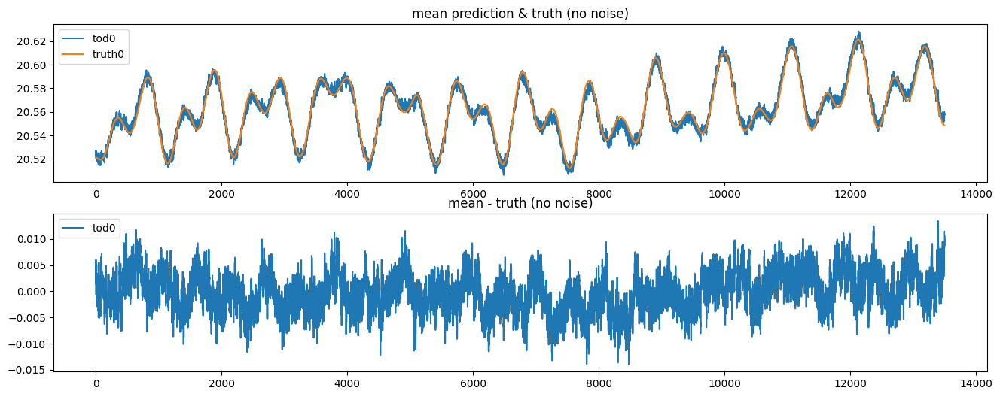

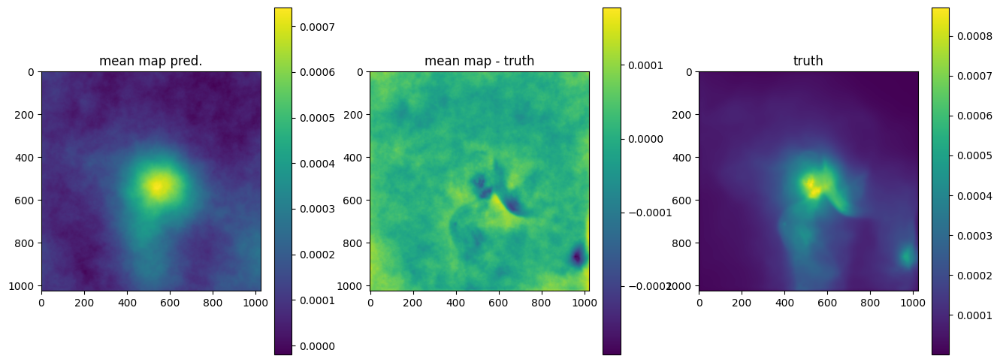

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+4.1326e+06 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+2.7786e+06 Δ⛰:1.3540e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+2.2121e+06 Δ⛰:5.6647e+05 ➽:1.5137e+01
SL: Iteration 3 ⛰:+1.6531e+06 Δ⛰:5.5906e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:+1.2055e+06 Δ⛰:4.4752e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:+8.5017e+05 Δ⛰:3.5536e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:+5.9814e+05 Δ⛰:2.5203e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:+3.9691e+05 Δ⛰:2.0123e+05 ➽:1.5137e+01
SL: Iteration 8 ⛰:+2.8978e+05 Δ⛰:1.0713e+05 ➽:1.5137e+01
SL: Iteration 9 ⛰:+2.8043e+05 Δ⛰:9.3419e+03 ➽:1.5137e+01
SL: Iteration 10 ⛰:+2.1082e+05 Δ⛰:6.9619e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:+1.3034e+05 Δ⛰:8.0473e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:+1.2147e+05 Δ⛰:8.8729e+03 ➽:1.5137e+01
SL: Iteration 13 ⛰:+6.3325e+04 Δ⛰:5.8145e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-9.7014e+02 Δ⛰:6.4295e+04 ➽:1.5137e+01
SL: Iteration 15 ⛰:-4.8625e+04 Δ⛰:4.7655e+04 ➽:1.5137e+01
SL: Iteration 16 ⛰:-8.1210e+04 Δ⛰:3.2585e+04 ➽:1.5137e+01
SL: 

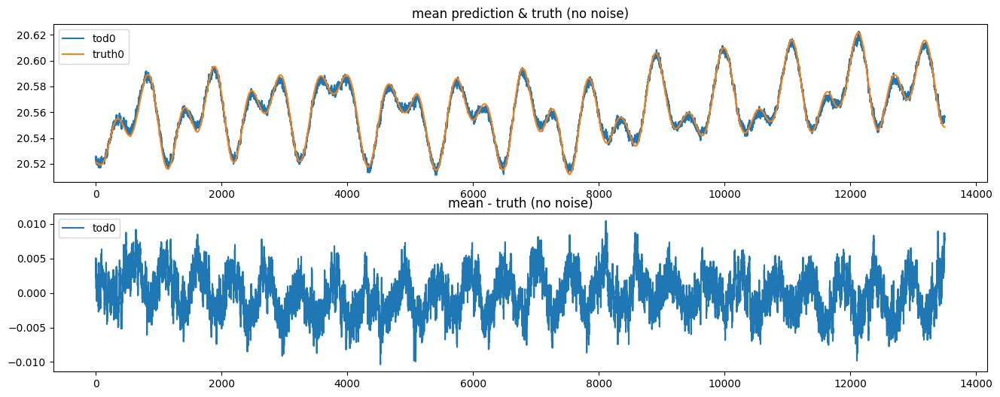

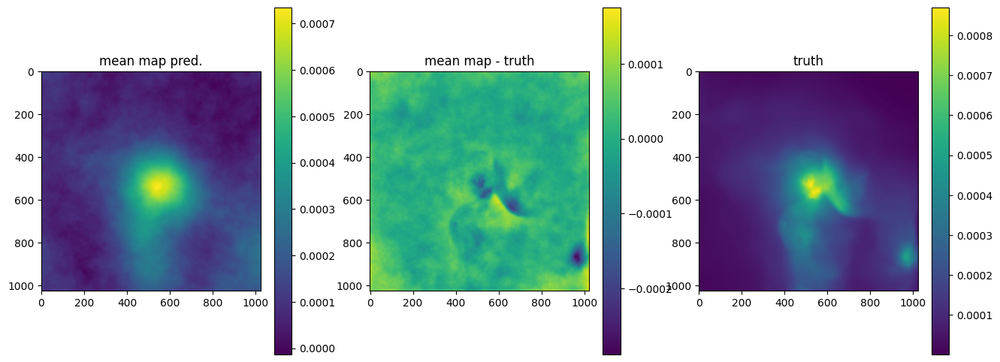

OPTIMIZE_KL: Starting 0004
SL: Iteration 0 ⛰:+1.3430e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+7.0703e+06 Δ⛰:6.3595e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+2.9738e+06 Δ⛰:4.0965e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:+1.5977e+06 Δ⛰:1.3761e+06 ➽:1.5137e+01
SL: Iteration 4 ⛰:+6.9270e+05 Δ⛰:9.0497e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:+4.1859e+05 Δ⛰:2.7411e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:+1.7137e+05 Δ⛰:2.4723e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:+7.7884e+04 Δ⛰:9.3481e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-4.8675e+04 Δ⛰:1.2656e+05 ➽:1.5137e+01
SL: Iteration 9 ⛰:-6.7725e+04 Δ⛰:1.9050e+04 ➽:1.5137e+01
SL: Iteration 10 ⛰:-1.1755e+05 Δ⛰:4.9826e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-1.6606e+05 Δ⛰:4.8514e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-2.0360e+05 Δ⛰:3.7540e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-2.0644e+05 Δ⛰:2.8336e+03 ➽:1.5137e+01
SL: Iteration 14 ⛰:-2.7012e+05 Δ⛰:6.3681e+04 ➽:1.5137e+01
SL: Iteration 15 ⛰:-3.0231e+05 Δ⛰:3.2191e+04 ➽:1.5137e+01
SL: Iteration 16 ⛰:-3.4172e+05 Δ⛰:3.9406e+04 ➽:1.5137e+01
SL: 

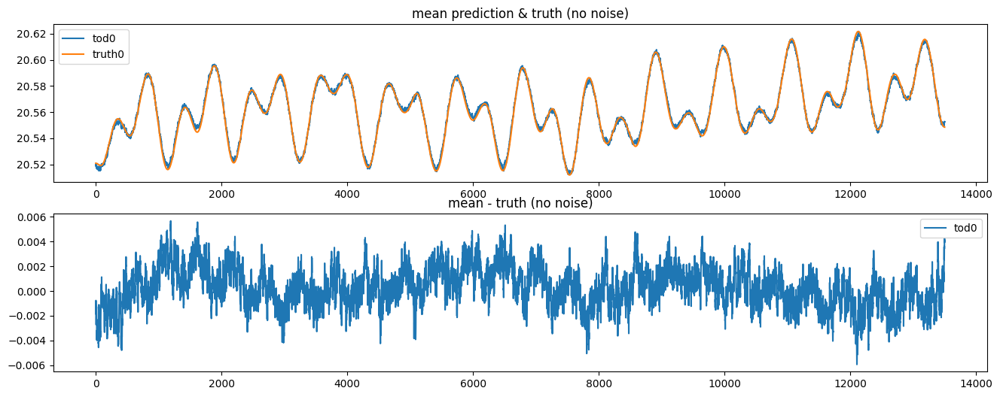

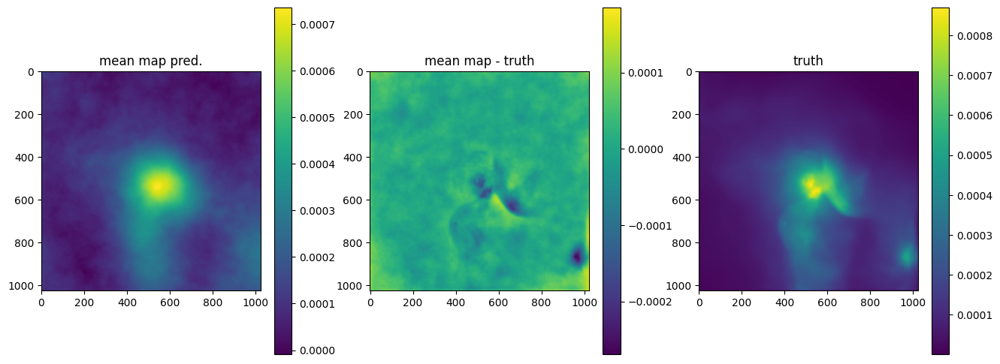

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+2.2806e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+7.9922e+06 Δ⛰:1.4814e+07 ➽:1.5137e+01
SL: Iteration 2 ⛰:+3.3782e+06 Δ⛰:4.6141e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:+2.0840e+06 Δ⛰:1.2941e+06 ➽:1.5137e+01
SL: Iteration 4 ⛰:+1.2607e+06 Δ⛰:8.2330e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:+3.1716e+05 Δ⛰:9.4358e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:+1.7287e+05 Δ⛰:1.4429e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-1.4880e+03 Δ⛰:1.7436e+05 ➽:1.5137e+01
SL: Iteration 8 ⛰:-1.6230e+05 Δ⛰:1.6081e+05 ➽:1.5137e+01
SL: Iteration 9 ⛰:-2.2476e+05 Δ⛰:6.2462e+04 ➽:1.5137e+01
SL: Iteration 10 ⛰:-2.2817e+05 Δ⛰:3.4096e+03 ➽:1.5137e+01
SL: Iteration 11 ⛰:-2.9007e+05 Δ⛰:6.1904e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-3.4535e+05 Δ⛰:5.5282e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-4.0155e+05 Δ⛰:5.6195e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-4.3695e+05 Δ⛰:3.5403e+04 ➽:1.5137e+01
SL: Iteration 15 ⛰:-4.7537e+05 Δ⛰:3.8417e+04 ➽:1.5137e+01
SL: Iteration 16 ⛰:-4.7850e+05 Δ⛰:3.1320e+03 ➽:1.5137e+01
SL: 

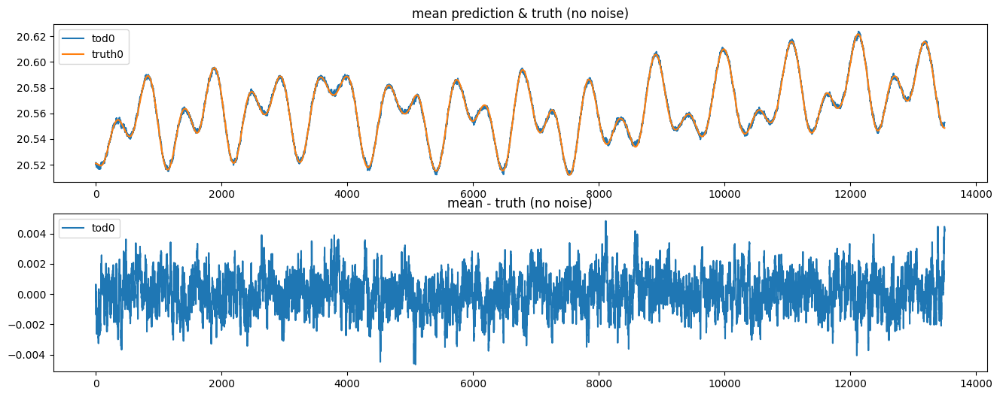

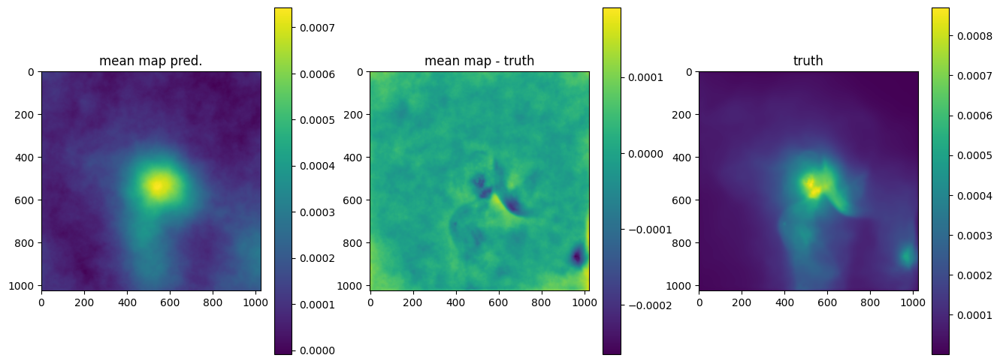

OPTIMIZE_KL: Starting 0006
SL: Iteration 0 ⛰:+4.7617e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+2.2501e+07 Δ⛰:2.5115e+07 ➽:1.5137e+01
SL: Iteration 2 ⛰:+5.2770e+06 Δ⛰:1.7224e+07 ➽:1.5137e+01
SL: Iteration 3 ⛰:+3.0678e+06 Δ⛰:2.2092e+06 ➽:1.5137e+01
SL: Iteration 4 ⛰:+1.1636e+06 Δ⛰:1.9042e+06 ➽:1.5137e+01
SL: Iteration 5 ⛰:+5.3408e+05 Δ⛰:6.2953e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:+1.5255e+05 Δ⛰:3.8153e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-2.4507e+04 Δ⛰:1.7706e+05 ➽:1.5137e+01
SL: Iteration 8 ⛰:-1.0112e+05 Δ⛰:7.6618e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-1.2222e+05 Δ⛰:2.1093e+04 ➽:1.5137e+01
SL: Iteration 10 ⛰:-1.9116e+05 Δ⛰:6.8940e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-2.8315e+05 Δ⛰:9.1993e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-3.3801e+05 Δ⛰:5.4862e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-3.6410e+05 Δ⛰:2.6091e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-4.1279e+05 Δ⛰:4.8691e+04 ➽:1.5137e+01
SL: Iteration 15 ⛰:-4.1583e+05 Δ⛰:3.0326e+03 ➽:1.5137e+01
SL: Iteration 16 ⛰:-4.5175e+05 Δ⛰:3.5927e+04 ➽:1.5137e+01
SL: 

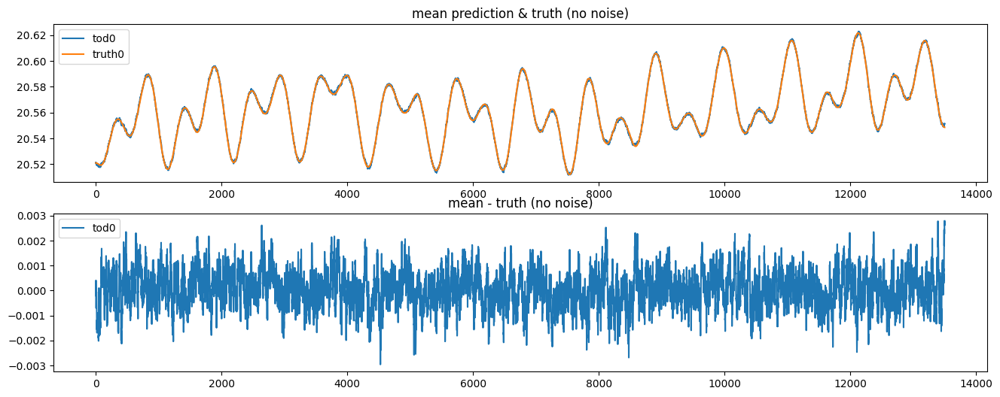

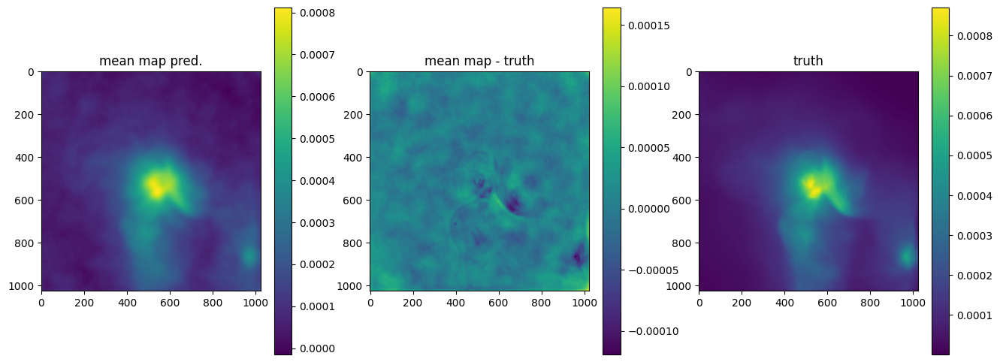

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+1.9976e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+3.5883e+06 Δ⛰:1.6388e+07 ➽:1.5137e+01
SL: Iteration 2 ⛰:+9.6514e+05 Δ⛰:2.6231e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:+5.1448e+05 Δ⛰:4.5066e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:+1.2649e+05 Δ⛰:3.8799e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-3.3455e+04 Δ⛰:1.5995e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-2.2449e+05 Δ⛰:1.9103e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-2.9122e+05 Δ⛰:6.6732e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-4.0215e+05 Δ⛰:1.1093e+05 ➽:1.5137e+01
SL: Iteration 9 ⛰:-4.0302e+05 Δ⛰:8.6598e+02 ➽:1.5137e+01
SL: Iteration 10 ⛰:-4.5386e+05 Δ⛰:5.0839e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-5.0461e+05 Δ⛰:5.0752e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-5.3738e+05 Δ⛰:3.2772e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-5.6442e+05 Δ⛰:2.7039e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-5.7780e+05 Δ⛰:1.3379e+04 ➽:1.5137e+01
SL: Iteration 15 ⛰:-5.7850e+05 Δ⛰:7.0481e+02 ➽:1.5137e+01
SL: Iteration 16 ⛰:-5.7869e+05 Δ⛰:1.8589e+02 ➽:1.5137e+01
SL: 

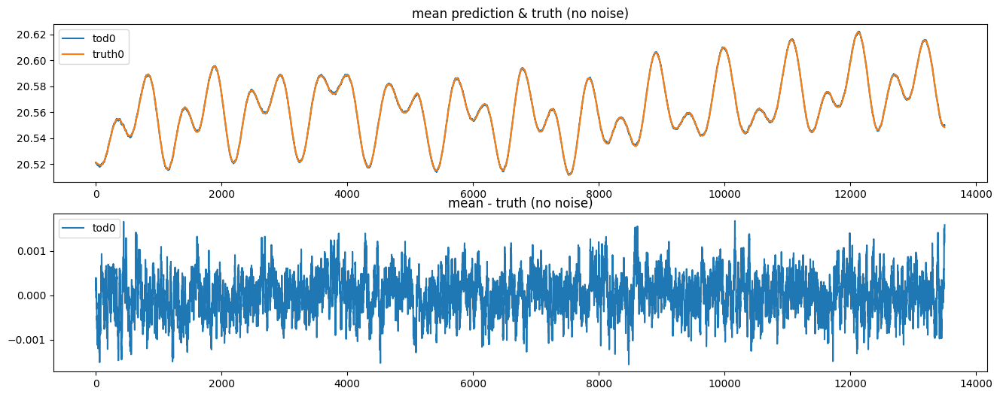

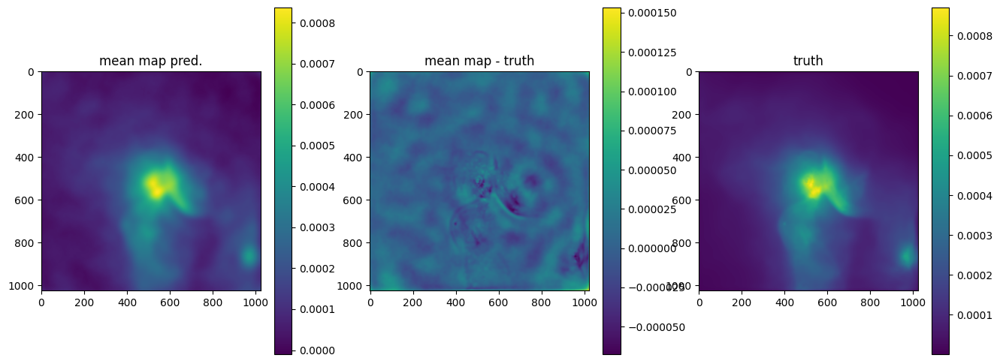

OPTIMIZE_KL: Starting 0008
SL: Iteration 0 ⛰:+4.3286e+06 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+7.9317e+05 Δ⛰:3.5354e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+6.3818e+05 Δ⛰:1.5499e+05 ➽:1.5137e+01
SL: Iteration 3 ⛰:+6.8808e+04 Δ⛰:5.6938e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:-3.2500e+05 Δ⛰:3.9380e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-4.0666e+05 Δ⛰:8.1665e+04 ➽:1.5137e+01
SL: Iteration 6 ⛰:-4.8325e+05 Δ⛰:7.6593e+04 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.3801e+05 Δ⛰:5.4760e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-5.7140e+05 Δ⛰:3.3386e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-5.7582e+05 Δ⛰:4.4167e+03 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.0100e+05 Δ⛰:2.5186e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.2247e+05 Δ⛰:2.1467e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.4100e+05 Δ⛰:1.8534e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.5161e+05 Δ⛰:1.0604e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.5373e+05 Δ⛰:2.1248e+03 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.5448e+05 Δ⛰:7.5121e+02 ➽:1.5137e+01
SL: Iteration 16 ⛰:-6.6444e+05 Δ⛰:9.9586e+03 ➽:1.5137e+01
SL: 

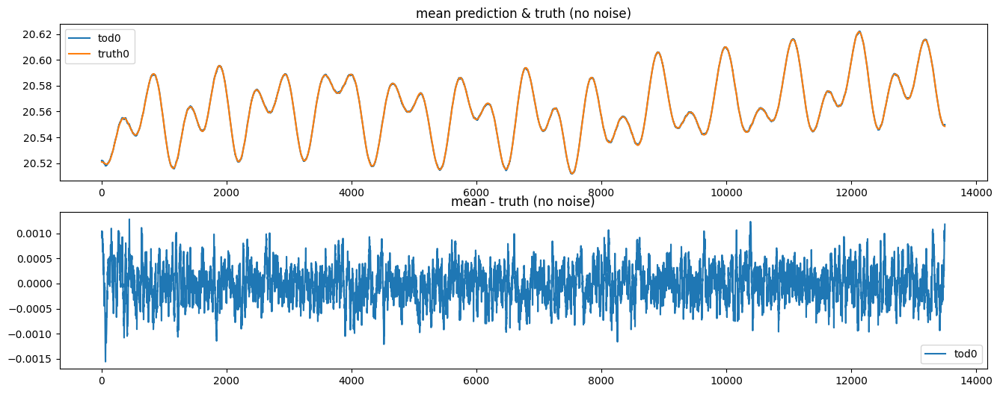

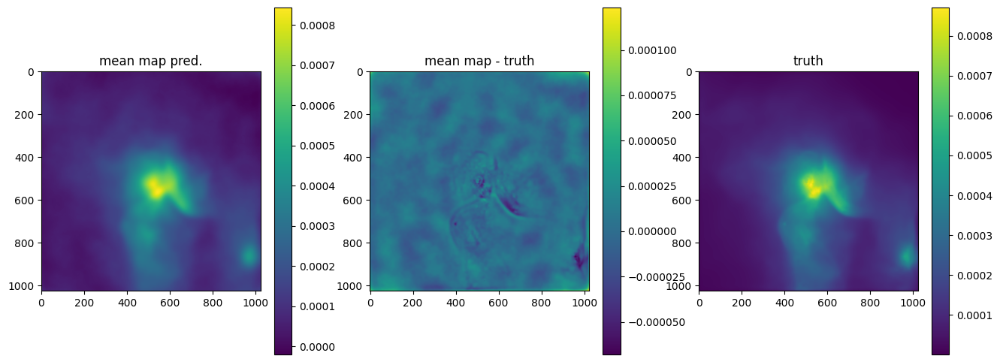

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+1.3254e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+8.1002e+06 Δ⛰:5.1540e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+1.4768e+06 Δ⛰:6.6234e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:+5.8437e+05 Δ⛰:8.9246e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:-3.6919e+05 Δ⛰:9.5355e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-4.6304e+05 Δ⛰:9.3850e+04 ➽:1.5137e+01
SL: Iteration 6 ⛰:-5.2892e+05 Δ⛰:6.5883e+04 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.6316e+05 Δ⛰:3.4244e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-6.0183e+05 Δ⛰:3.8664e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-6.0216e+05 Δ⛰:3.2987e+02 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.2638e+05 Δ⛰:2.4226e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.5640e+05 Δ⛰:3.0021e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.6867e+05 Δ⛰:1.2272e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.6912e+05 Δ⛰:4.4392e+02 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.7977e+05 Δ⛰:1.0655e+04 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.8348e+05 Δ⛰:3.7066e+03 ➽:1.5137e+01
SL: Iteration 16 ⛰:-6.8771e+05 Δ⛰:4.2274e+03 ➽:1.5137e+01
SL: 

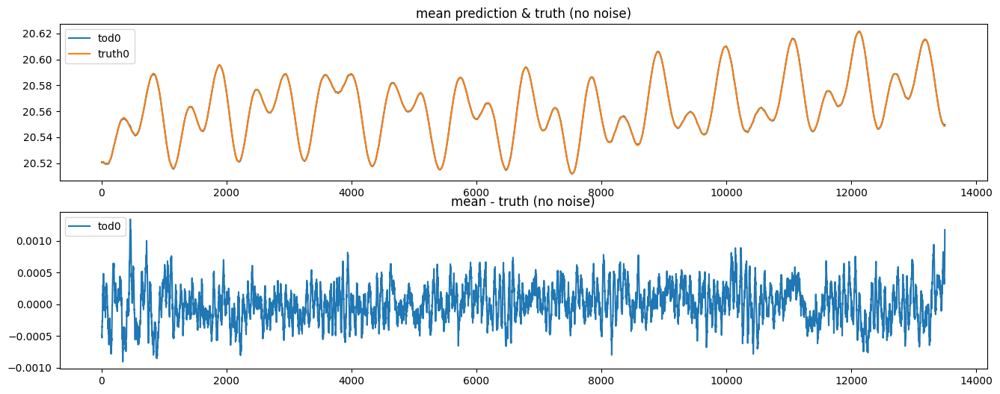

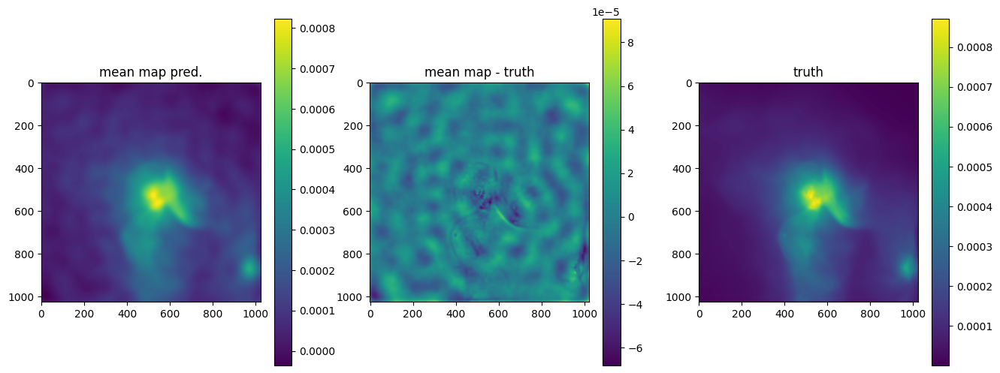

OPTIMIZE_KL: Starting 0010
SL: Iteration 0 ⛰:+5.8992e+06 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+3.7313e+06 Δ⛰:2.1679e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+5.0732e+04 Δ⛰:3.6806e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:-3.3909e+05 Δ⛰:3.8982e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:-4.5965e+05 Δ⛰:1.2056e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-5.6564e+05 Δ⛰:1.0599e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-5.9798e+05 Δ⛰:3.2338e+04 ➽:1.5137e+01
SL: Iteration 7 ⛰:-6.2695e+05 Δ⛰:2.8967e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-6.2838e+05 Δ⛰:1.4320e+03 ➽:1.5137e+01
SL: Iteration 9 ⛰:-6.4945e+05 Δ⛰:2.1069e+04 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.6551e+05 Δ⛰:1.6067e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.7532e+05 Δ⛰:9.8072e+03 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.8427e+05 Δ⛰:8.9497e+03 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.9065e+05 Δ⛰:6.3782e+03 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.9865e+05 Δ⛰:8.0026e+03 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.9915e+05 Δ⛰:4.9741e+02 ➽:1.5137e+01
SL: Iteration 16 ⛰:-7.0632e+05 Δ⛰:7.1677e+03 ➽:1.5137e+01
SL: 

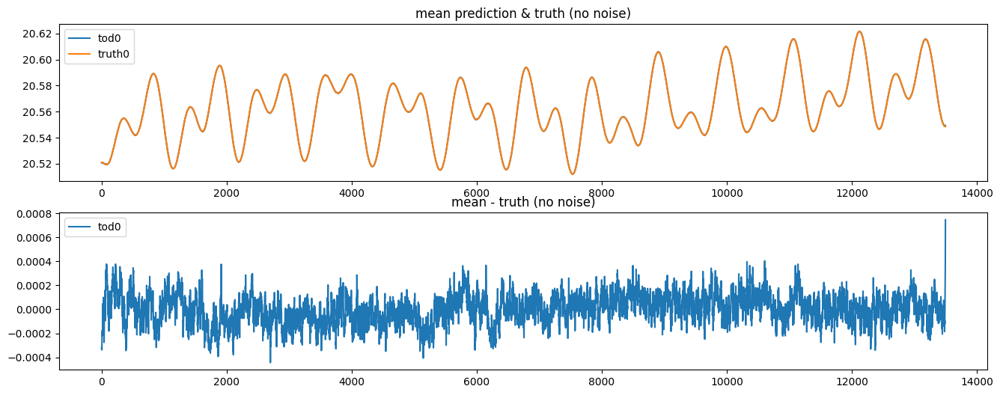

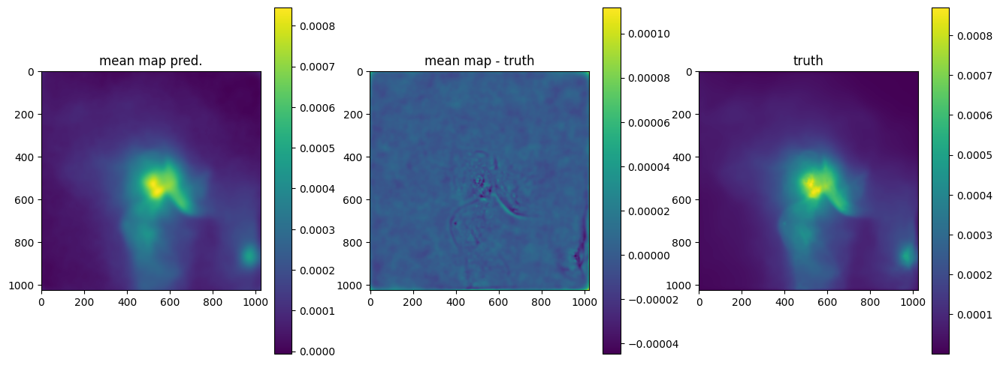

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+7.7341e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+1.1280e+06 Δ⛰:7.6213e+07 ➽:1.5137e+01
SL: Iteration 2 ⛰:+6.4792e+05 Δ⛰:4.8008e+05 ➽:1.5137e+01
SL: Iteration 3 ⛰:-1.6134e+05 Δ⛰:8.0925e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:-3.1474e+05 Δ⛰:1.5340e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-4.5482e+05 Δ⛰:1.4008e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-5.6862e+05 Δ⛰:1.1379e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.9236e+05 Δ⛰:2.3746e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-5.9558e+05 Δ⛰:3.2182e+03 ➽:1.5137e+01
SL: Iteration 9 ⛰:-6.2978e+05 Δ⛰:3.4197e+04 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.6198e+05 Δ⛰:3.2203e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.7943e+05 Δ⛰:1.7447e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.8782e+05 Δ⛰:8.3890e+03 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.8926e+05 Δ⛰:1.4431e+03 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.9739e+05 Δ⛰:8.1328e+03 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.9742e+05 Δ⛰:3.1846e+01 ➽:1.5137e+01
SL: Iteration 16 ⛰:-7.0560e+05 Δ⛰:8.1738e+03 ➽:1.5137e+01
SL: 

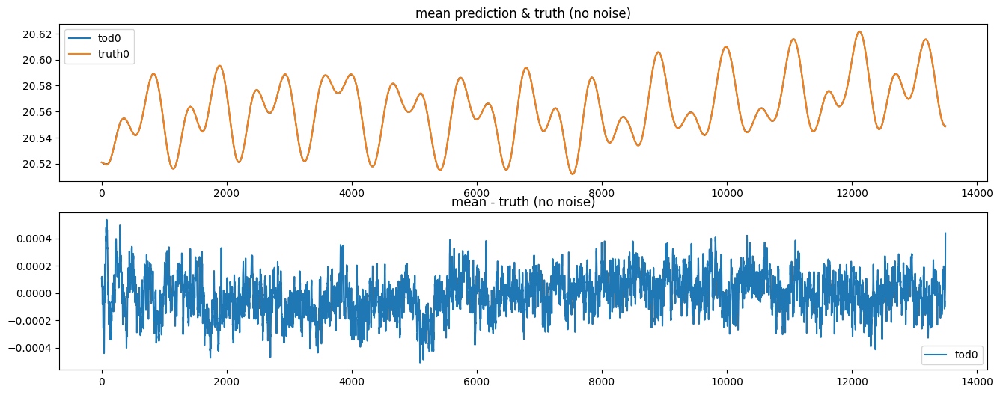

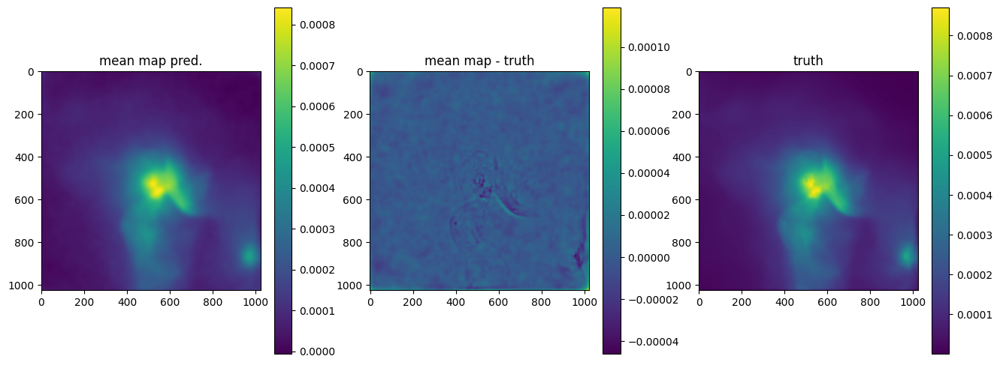

OPTIMIZE_KL: Starting 0012
SL: Iteration 0 ⛰:+2.0458e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+3.4014e+06 Δ⛰:1.7056e+07 ➽:1.5137e+01
SL: Iteration 2 ⛰:+3.3423e+05 Δ⛰:3.0672e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:-2.0179e+05 Δ⛰:5.3602e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:-3.8597e+05 Δ⛰:1.8418e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-4.9001e+05 Δ⛰:1.0404e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-5.2860e+05 Δ⛰:3.8590e+04 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.5514e+05 Δ⛰:2.6543e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-6.2757e+05 Δ⛰:7.2430e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-6.3668e+05 Δ⛰:9.1063e+03 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.6498e+05 Δ⛰:2.8303e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.8381e+05 Δ⛰:1.8827e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.9081e+05 Δ⛰:7.0001e+03 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.9816e+05 Δ⛰:7.3530e+03 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.9844e+05 Δ⛰:2.7762e+02 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.9847e+05 Δ⛰:3.1193e+01 ➽:1.5137e+01
SL: Iteration 16 ⛰:-7.0474e+05 Δ⛰:6.2671e+03 ➽:1.5137e+01
SL: 

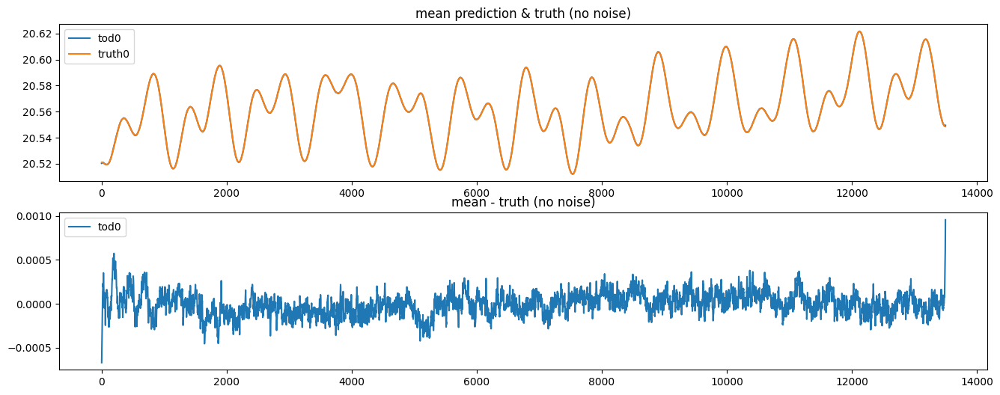

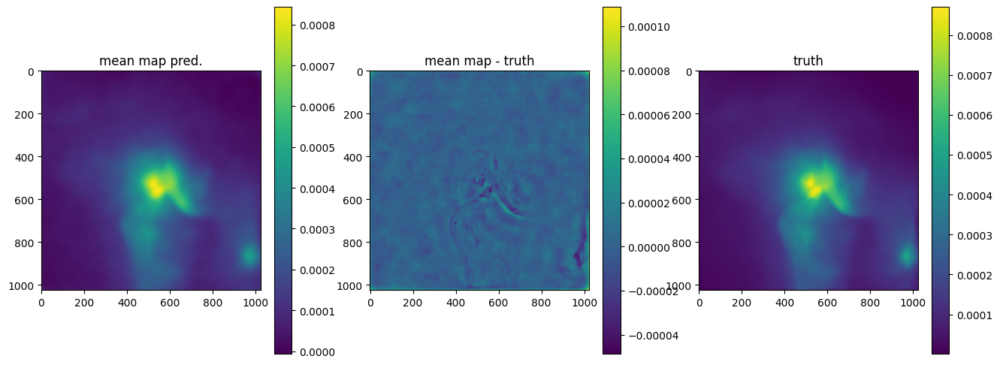

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+9.0407e+06 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+7.3654e+06 Δ⛰:1.6752e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+3.3240e+06 Δ⛰:4.0414e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:-2.6443e+05 Δ⛰:3.5885e+06 ➽:1.5137e+01
SL: Iteration 4 ⛰:-3.4879e+05 Δ⛰:8.4355e+04 ➽:1.5137e+01
SL: Iteration 5 ⛰:-4.3689e+05 Δ⛰:8.8099e+04 ➽:1.5137e+01
SL: Iteration 6 ⛰:-5.0638e+05 Δ⛰:6.9491e+04 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.5975e+05 Δ⛰:5.3370e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-5.9685e+05 Δ⛰:3.7105e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-5.9786e+05 Δ⛰:1.0054e+03 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.2535e+05 Δ⛰:2.7487e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.4985e+05 Δ⛰:2.4501e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.7123e+05 Δ⛰:2.1380e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.8332e+05 Δ⛰:1.2094e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.8371e+05 Δ⛰:3.9140e+02 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.9556e+05 Δ⛰:1.1853e+04 ➽:1.5137e+01
SL: Iteration 16 ⛰:-6.9561e+05 Δ⛰:4.4206e+01 ➽:1.5137e+01
SL: 

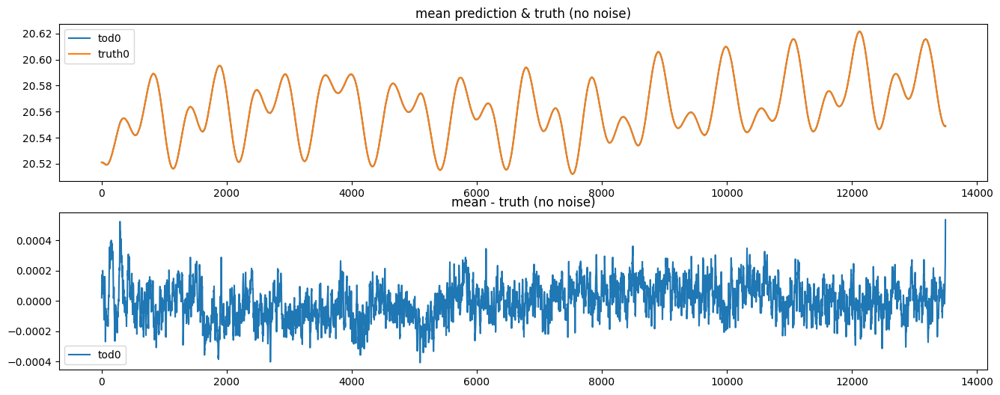

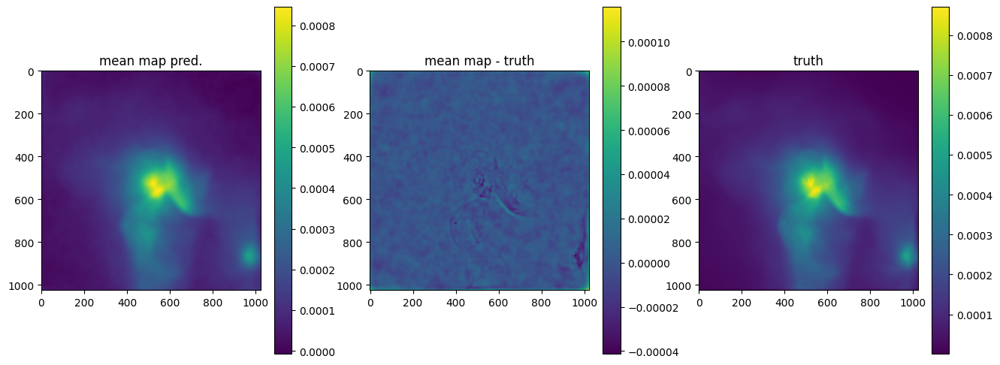

OPTIMIZE_KL: Starting 0014
SL: Iteration 0 ⛰:+9.0451e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+9.2773e+06 Δ⛰:8.1174e+07 ➽:1.5137e+01
SL: Iteration 2 ⛰:+2.6622e+06 Δ⛰:6.6151e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:+8.5040e+05 Δ⛰:1.8118e+06 ➽:1.5137e+01
SL: Iteration 4 ⛰:+2.4104e+05 Δ⛰:6.0936e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-2.6472e+05 Δ⛰:5.0576e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-3.9431e+05 Δ⛰:1.2959e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-4.5130e+05 Δ⛰:5.6988e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-5.6108e+05 Δ⛰:1.0978e+05 ➽:1.5137e+01
SL: Iteration 9 ⛰:-5.6152e+05 Δ⛰:4.4629e+02 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.1454e+05 Δ⛰:5.3018e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.4516e+05 Δ⛰:3.0613e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.6667e+05 Δ⛰:2.1518e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.8417e+05 Δ⛰:1.7498e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.8549e+05 Δ⛰:1.3176e+03 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.9455e+05 Δ⛰:9.0564e+03 ➽:1.5137e+01
SL: Iteration 16 ⛰:-6.9466e+05 Δ⛰:1.1133e+02 ➽:1.5137e+01
SL: 

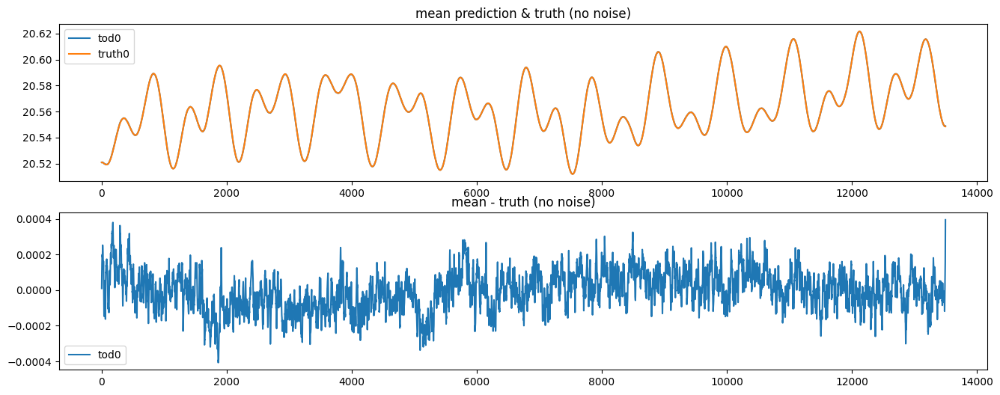

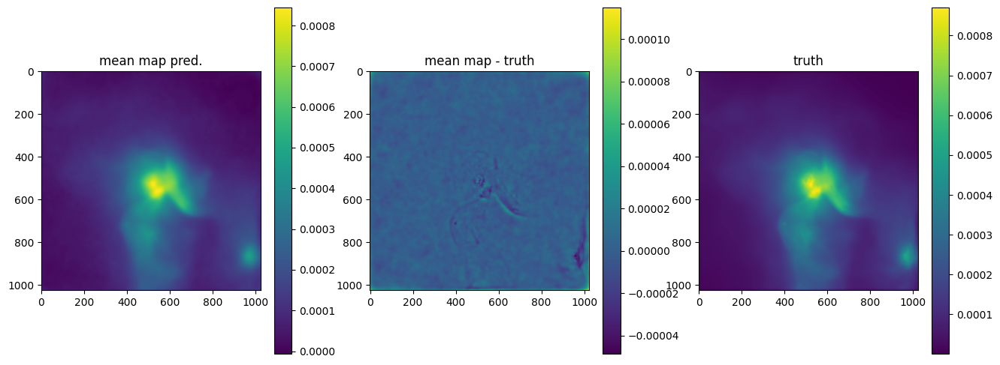

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+2.2476e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+8.1188e+06 Δ⛰:1.4358e+07 ➽:1.5137e+01
SL: Iteration 2 ⛰:+9.3179e+05 Δ⛰:7.1870e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:+1.3969e+05 Δ⛰:7.9210e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:-6.8864e+04 Δ⛰:2.0855e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-2.0790e+05 Δ⛰:1.3904e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-4.2596e+05 Δ⛰:2.1805e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.5712e+05 Δ⛰:1.3116e+05 ➽:1.5137e+01
SL: Iteration 8 ⛰:-5.7765e+05 Δ⛰:2.0526e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-5.7801e+05 Δ⛰:3.6786e+02 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.1006e+05 Δ⛰:3.2046e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.3273e+05 Δ⛰:2.2674e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.5253e+05 Δ⛰:1.9791e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.7087e+05 Δ⛰:1.8348e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.7265e+05 Δ⛰:1.7754e+03 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.8728e+05 Δ⛰:1.4636e+04 ➽:1.5137e+01
SL: Iteration 16 ⛰:-6.8754e+05 Δ⛰:2.5398e+02 ➽:1.5137e+01
SL: 

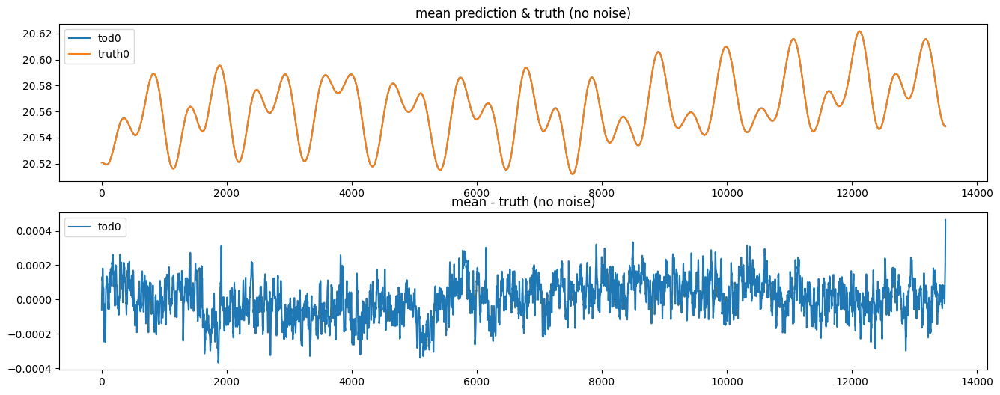

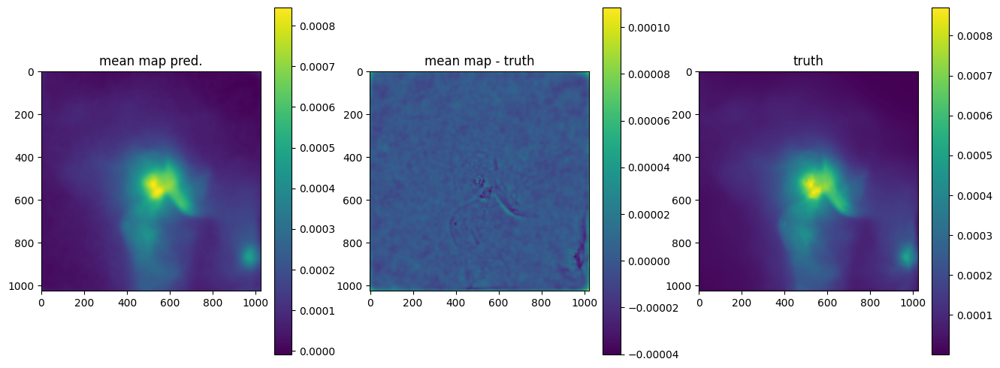

OPTIMIZE_KL: Starting 0016
SL: Iteration 0 ⛰:+4.8564e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+1.5702e+06 Δ⛰:4.6994e+07 ➽:1.5137e+01
SL: Iteration 2 ⛰:+8.1196e+05 Δ⛰:7.5823e+05 ➽:1.5137e+01
SL: Iteration 3 ⛰:+3.2926e+05 Δ⛰:4.8271e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:-4.7071e+04 Δ⛰:3.7633e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-2.6380e+05 Δ⛰:2.1673e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-4.2376e+05 Δ⛰:1.5996e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.3181e+05 Δ⛰:1.0805e+05 ➽:1.5137e+01
SL: Iteration 8 ⛰:-5.7881e+05 Δ⛰:4.7001e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-5.7901e+05 Δ⛰:1.9963e+02 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.0763e+05 Δ⛰:2.8619e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.3860e+05 Δ⛰:3.0969e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.5554e+05 Δ⛰:1.6936e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.7085e+05 Δ⛰:1.5315e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.8255e+05 Δ⛰:1.1697e+04 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.8304e+05 Δ⛰:4.8983e+02 ➽:1.5137e+01
SL: Iteration 16 ⛰:-6.8313e+05 Δ⛰:9.6142e+01 ➽:1.5137e+01
SL: 

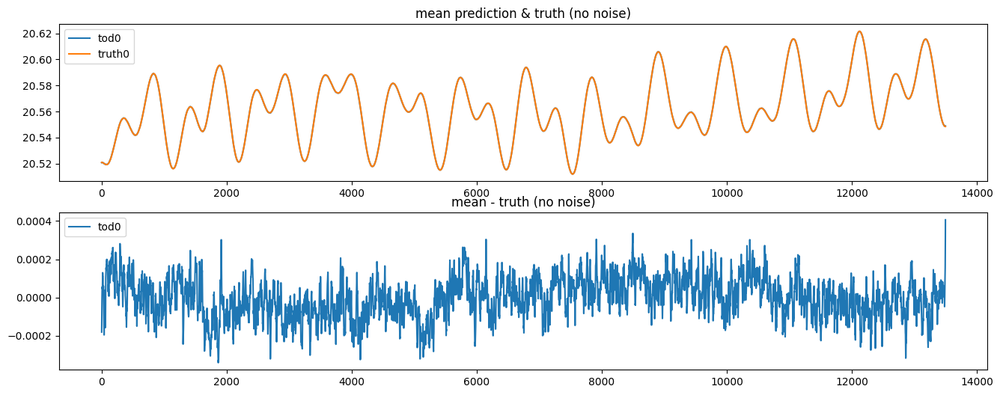

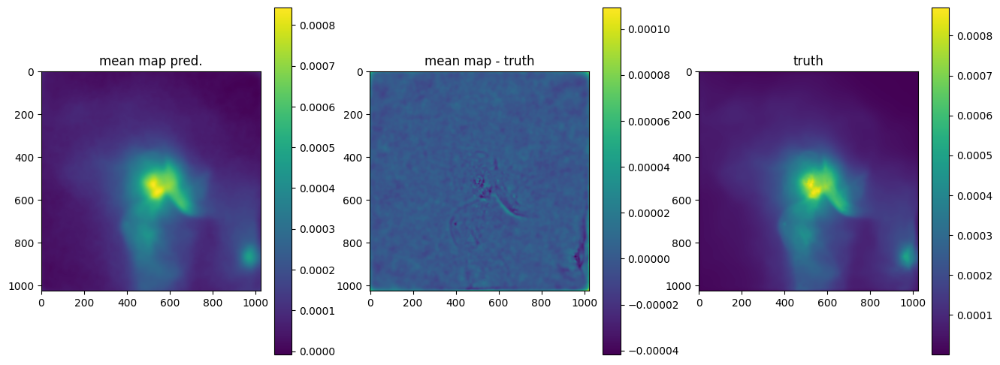

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+6.2322e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+8.8747e+06 Δ⛰:5.3447e+07 ➽:1.5137e+01
SL: Iteration 2 ⛰:+1.3565e+06 Δ⛰:7.5183e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:+6.5777e+05 Δ⛰:6.9870e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:+5.0611e+04 Δ⛰:6.0715e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-2.7513e+05 Δ⛰:3.2574e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-4.6992e+05 Δ⛰:1.9479e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.8682e+05 Δ⛰:1.1690e+05 ➽:1.5137e+01
SL: Iteration 8 ⛰:-6.0235e+05 Δ⛰:1.5530e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-6.0273e+05 Δ⛰:3.8136e+02 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.2809e+05 Δ⛰:2.5363e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.6005e+05 Δ⛰:3.1953e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.7269e+05 Δ⛰:1.2644e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.7981e+05 Δ⛰:7.1183e+03 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.8910e+05 Δ⛰:9.2908e+03 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.8950e+05 Δ⛰:4.0377e+02 ➽:1.5137e+01
SL: Iteration 16 ⛰:-6.8956e+05 Δ⛰:6.1551e+01 ➽:1.5137e+01
SL: 

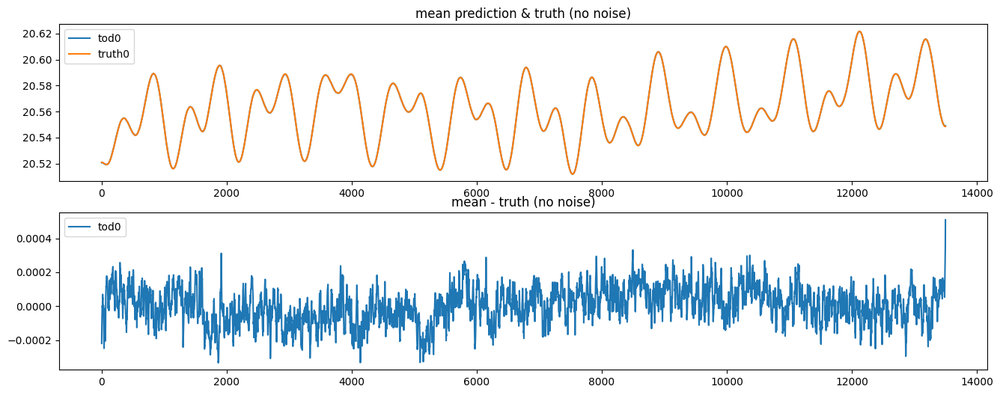

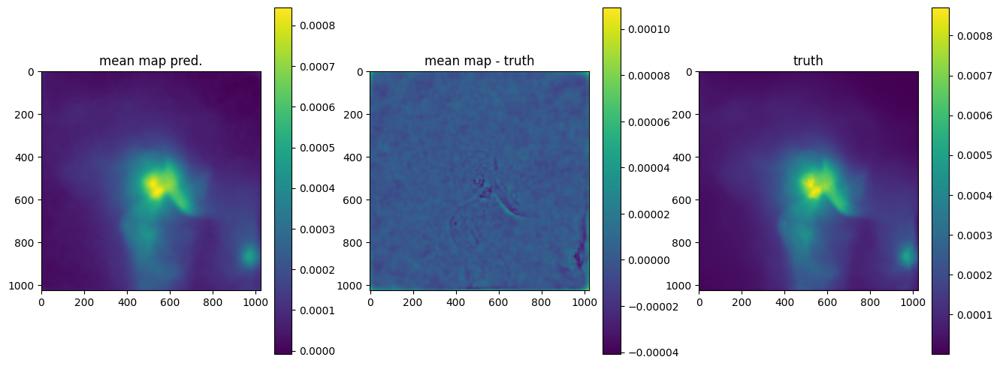

OPTIMIZE_KL: Starting 0018
SL: Iteration 0 ⛰:+6.5383e+06 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+2.4186e+06 Δ⛰:4.1197e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+1.1353e+06 Δ⛰:1.2833e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:+5.0035e+05 Δ⛰:6.3494e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:+9.9993e+04 Δ⛰:4.0036e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-1.4979e+05 Δ⛰:2.4978e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-3.7688e+05 Δ⛰:2.2708e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-4.8745e+05 Δ⛰:1.1058e+05 ➽:1.5137e+01
SL: Iteration 8 ⛰:-5.5001e+05 Δ⛰:6.2552e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-5.9698e+05 Δ⛰:4.6969e+04 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.0665e+05 Δ⛰:9.6711e+03 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.4223e+05 Δ⛰:3.5586e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.5606e+05 Δ⛰:1.3823e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.7437e+05 Δ⛰:1.8318e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.8272e+05 Δ⛰:8.3445e+03 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.9431e+05 Δ⛰:1.1596e+04 ➽:1.5137e+01
SL: Iteration 16 ⛰:-6.9447e+05 Δ⛰:1.6045e+02 ➽:1.5137e+01
SL: 

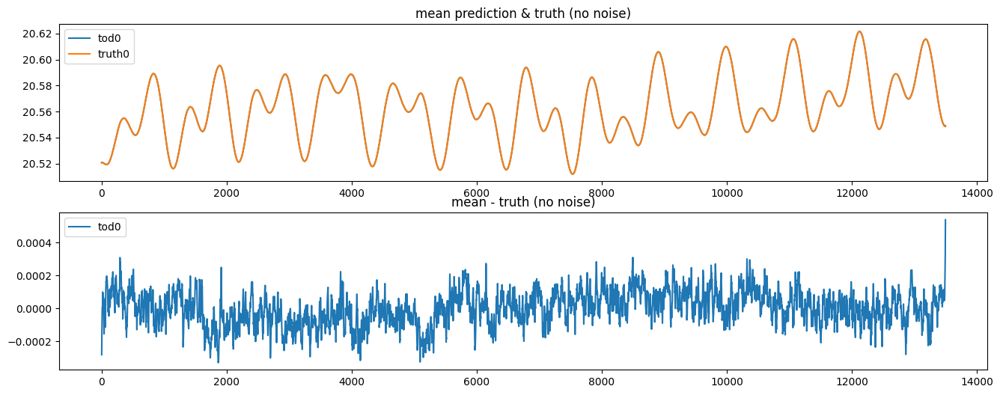

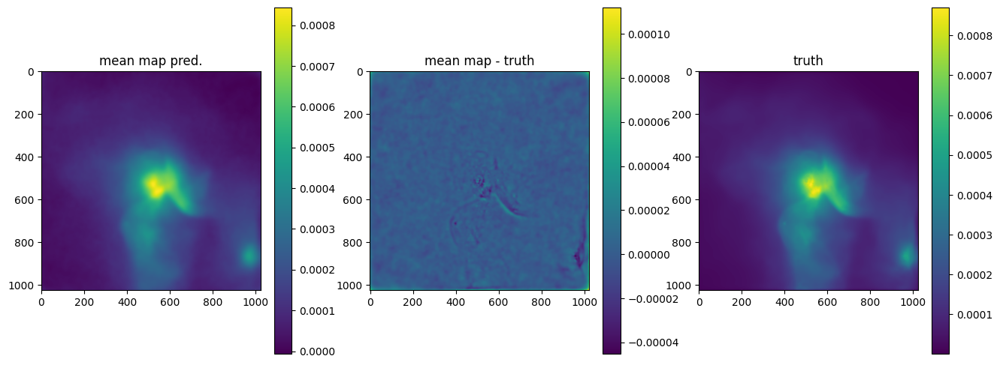

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+2.3200e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+1.6065e+07 Δ⛰:7.1358e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+3.2729e+06 Δ⛰:1.2792e+07 ➽:1.5137e+01
SL: Iteration 3 ⛰:+1.5163e+05 Δ⛰:3.1213e+06 ➽:1.5137e+01
SL: Iteration 4 ⛰:-2.1549e+05 Δ⛰:3.6711e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-3.9676e+05 Δ⛰:1.8127e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-4.9975e+05 Δ⛰:1.0299e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.5074e+05 Δ⛰:5.0995e+04 ➽:1.5137e+01
SL: Iteration 8 ⛰:-5.8034e+05 Δ⛰:2.9593e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-5.9737e+05 Δ⛰:1.7035e+04 ➽:1.5137e+01
SL: Iteration 10 ⛰:-6.2337e+05 Δ⛰:2.6001e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.4510e+05 Δ⛰:2.1729e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.6229e+05 Δ⛰:1.7185e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.7515e+05 Δ⛰:1.2860e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.7596e+05 Δ⛰:8.1259e+02 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.8444e+05 Δ⛰:8.4770e+03 ➽:1.5137e+01
SL: Iteration 16 ⛰:-6.9064e+05 Δ⛰:6.1991e+03 ➽:1.5137e+01
SL: 

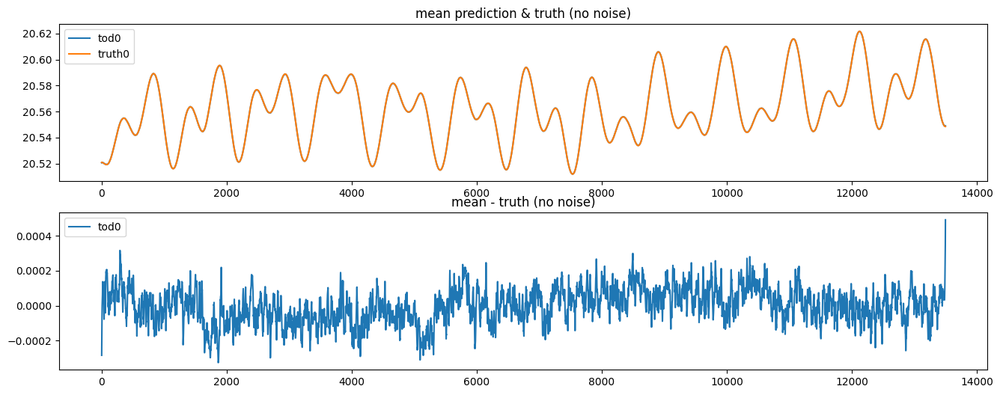

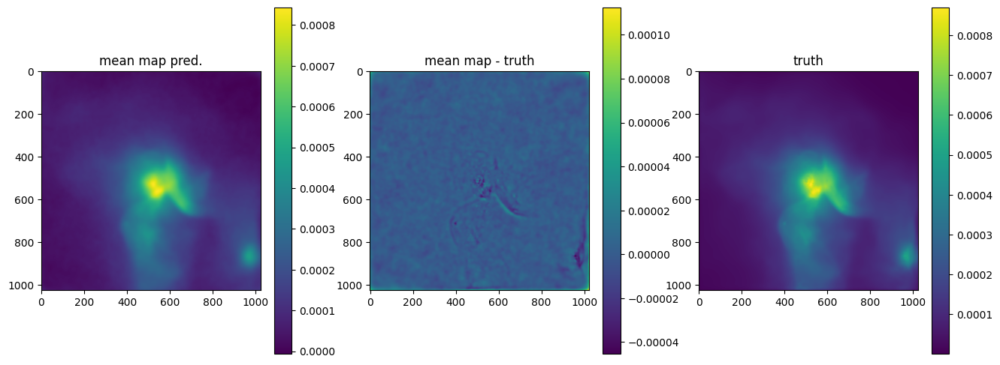

OPTIMIZE_KL: Starting 0020
SL: Iteration 0 ⛰:+1.2802e+07 Δ⛰:inf ➽:1.5137e+01
SL: Iteration 1 ⛰:+4.5141e+06 Δ⛰:8.2877e+06 ➽:1.5137e+01
SL: Iteration 2 ⛰:+6.8410e+05 Δ⛰:3.8300e+06 ➽:1.5137e+01
SL: Iteration 3 ⛰:+2.8979e+05 Δ⛰:3.9432e+05 ➽:1.5137e+01
SL: Iteration 4 ⛰:+3.8148e+04 Δ⛰:2.5164e+05 ➽:1.5137e+01
SL: Iteration 5 ⛰:-2.3461e+05 Δ⛰:2.7276e+05 ➽:1.5137e+01
SL: Iteration 6 ⛰:-3.8847e+05 Δ⛰:1.5386e+05 ➽:1.5137e+01
SL: Iteration 7 ⛰:-5.2131e+05 Δ⛰:1.3284e+05 ➽:1.5137e+01
SL: Iteration 8 ⛰:-5.6280e+05 Δ⛰:4.1489e+04 ➽:1.5137e+01
SL: Iteration 9 ⛰:-5.7857e+05 Δ⛰:1.5769e+04 ➽:1.5137e+01
SL: Iteration 10 ⛰:-5.9306e+05 Δ⛰:1.4490e+04 ➽:1.5137e+01
SL: Iteration 11 ⛰:-6.4703e+05 Δ⛰:5.3974e+04 ➽:1.5137e+01
SL: Iteration 12 ⛰:-6.6440e+05 Δ⛰:1.7365e+04 ➽:1.5137e+01
SL: Iteration 13 ⛰:-6.7955e+05 Δ⛰:1.5152e+04 ➽:1.5137e+01
SL: Iteration 14 ⛰:-6.9236e+05 Δ⛰:1.2816e+04 ➽:1.5137e+01
SL: Iteration 15 ⛰:-6.9351e+05 Δ⛰:1.1499e+03 ➽:1.5137e+01
SL: Iteration 16 ⛰:-7.0297e+05 Δ⛰:9.4544e+03 ➽:1.5137e+01
SL: 

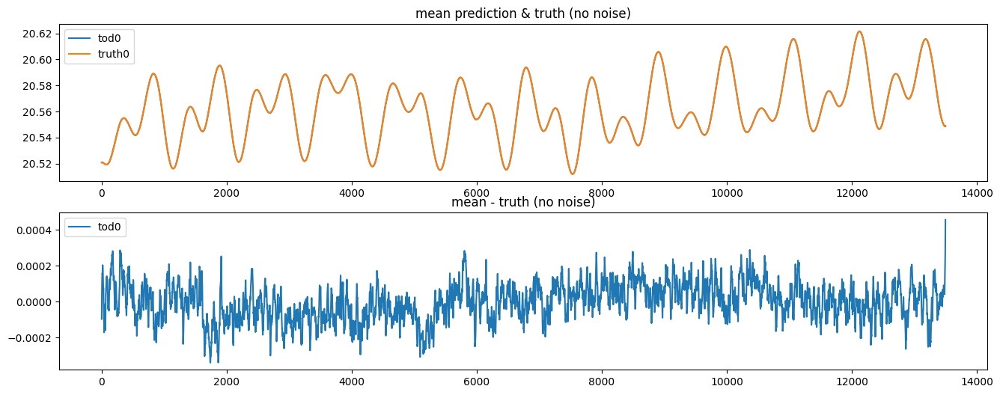

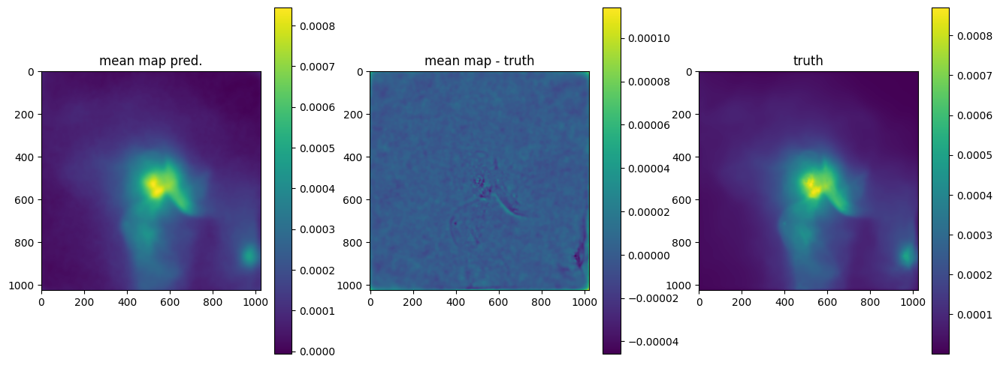

In [25]:
# n_it = 10
n_it = 20
# n_it = 50

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    # for i in range(0, n, n//10):
    # for i in range(0, mean.shape[0], mean.shape[0]//10):
    for i in range(n):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean prediction & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean - truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=10),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=10
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [26]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.009699934213940196, 0.005, 0.003
	loglogvarslope: -2.560034727776439, -3, 0.5
	zeromode std (LogNormal): 0.0003507587255709187, 0.0005, 0.001
map:
	fluctuations: 1.3181709020187305e-05, 3e-05, 1e-05
	loglogvarslope: -2.6824062226887793, -2.5, 0.5
	zeromode std (LogNormal): 9.928224622724387e-09, 1e-08, 1e-07


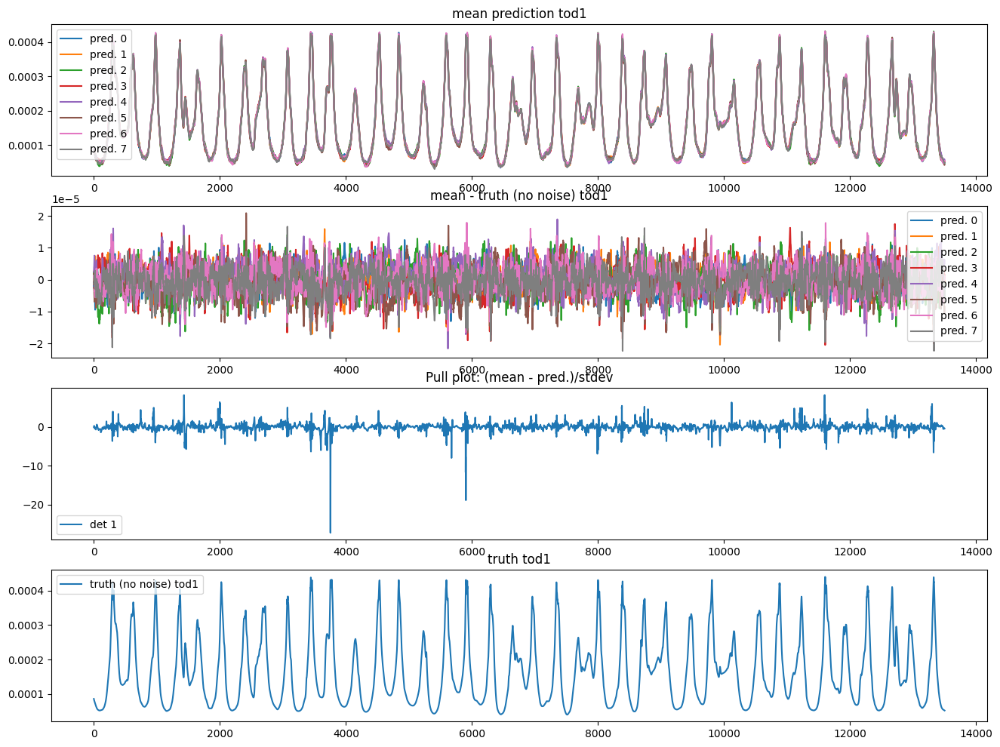

In [27]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

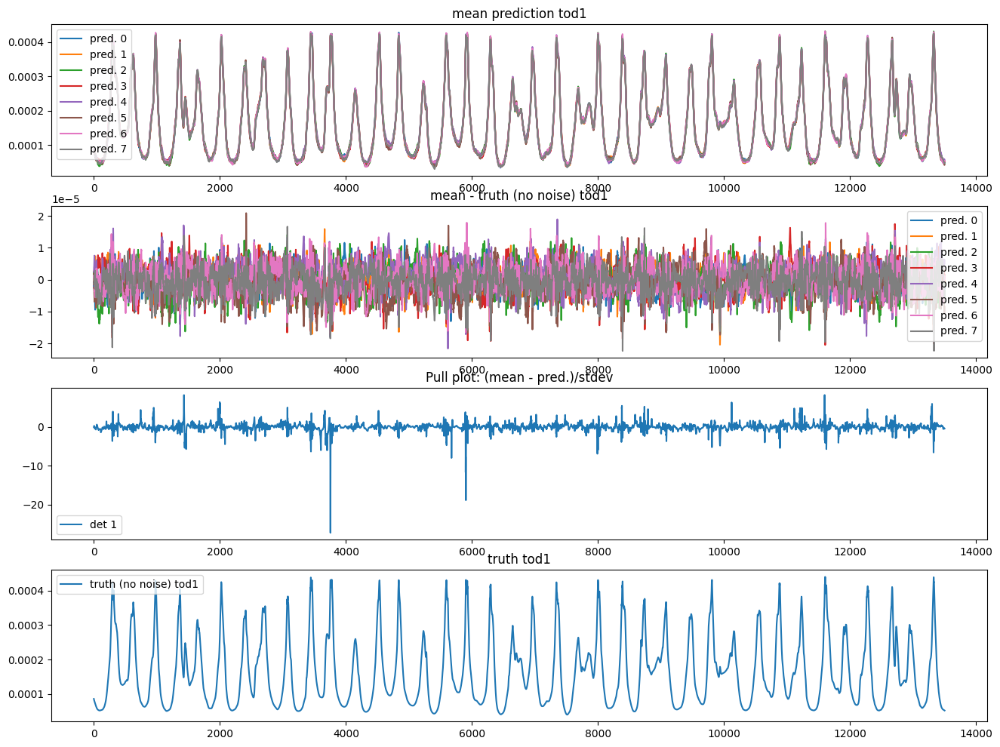

In [28]:
fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [32]:
# Compare with maria mapper:
from maria.map.mappers import BinMapper

mapper = BinMapper(center=(300.0, -10.0),
                   frame="ra_dec",
                   width=1.,
                   height=1.,
                   resolution=np.degrees(np.nanmin(instrument.fwhm))/4.,
                   tod_postprocessing={
                        "window": {"tukey": {"alpha": 0.1}},
                        "remove_modes": {"n": 1},
                        "highpass": {"f": 0.05},
                        "despline": {"spacing": 10},
                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                    },
                  )


mapper.add_tods(tod_truthmap)
output_map = mapper.run()

Running mapper (f092): 100%|██████████| 1/1 [01:54<00:00, 114.18s/it]


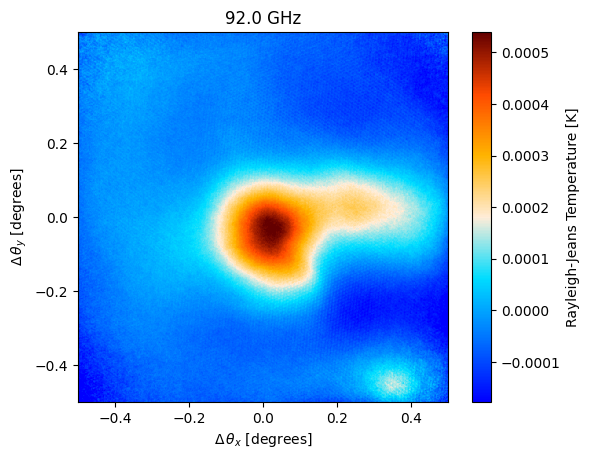

In [34]:
output_map.plot()

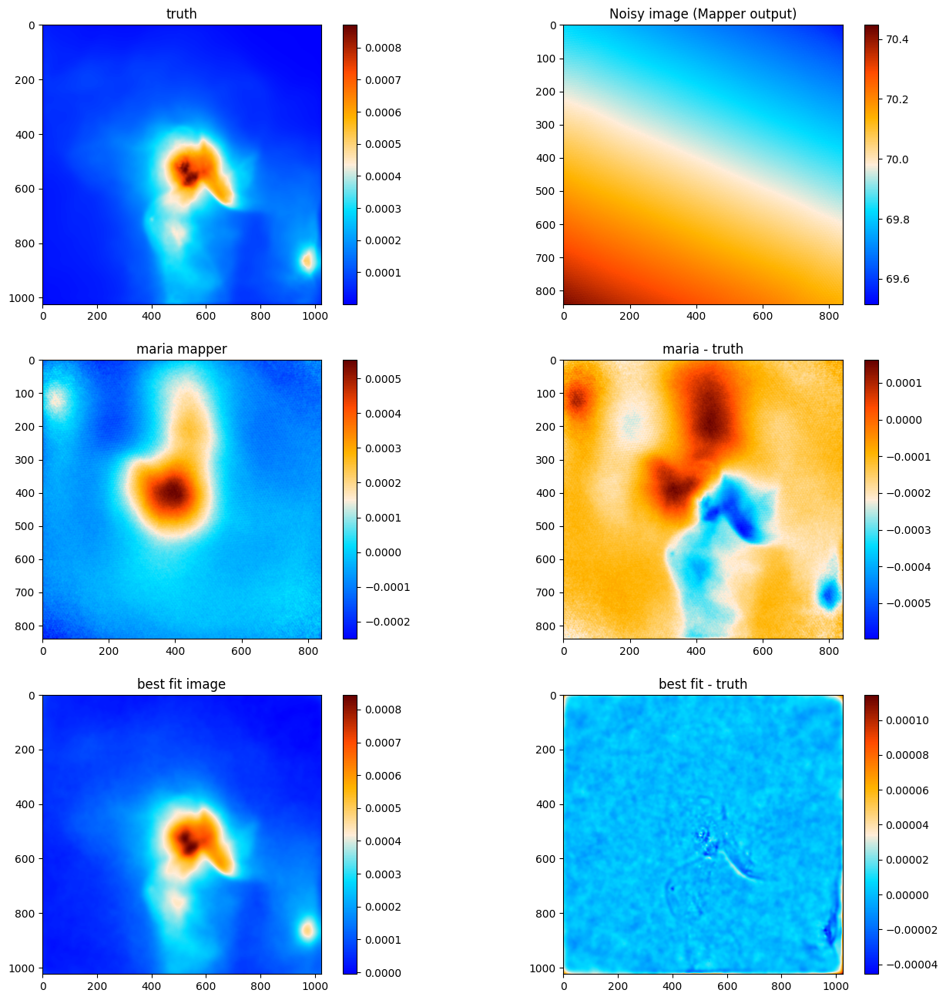

In [35]:
from skimage.transform import resize

# Compare nifty vs maria
sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(np.flip(output_truthmap.data[0], axis=(0,1)), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow( np.flip(output_map.data[0], axis=(0,1)), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0], (841,841), anti_aliasing=True)
im3 = axes[1,1].imshow(( np.flip(output_map.data[0], axis=(0,1)) - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()